In [1]:
# Import necessary libraries
import os
import re
import mne
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt

onedir = 'C:\\Users\\tyalb\\OneDrive\\Documents\\'
onedir = 'C:\\Users\\tyler_p5hze3w\\OneDrive\\Documents\\'
pydir = onedir + 'python_code\\'
matdir = onedir + 'MATLAB\\'
wsdir = matdir + 'Walking_Study_EEG\\'
datadir = pydir + 'python_projects\\SIPLab\\iEEG\\processed_data\\'

## Load data

In [2]:
data_files = os.listdir(datadir)
data_files = [data_file for data_file in data_files if 'participant' not in data_file]

# partition the data into soz labeled and non soz labeled participants
all_run_data_no_soz = {}
all_run_data_no_soz['ecog_x'] = []
all_run_data_no_soz['stim_x'] = []
all_run_data_no_soz['ecog_pos_x'] = []
all_run_data_no_soz['ecog_ch_name_x'] = []
all_run_data_no_soz['ecog_loc_text_y'] = []
all_run_data_no_soz['ecog_loc_idx_y'] = []
all_run_data_no_soz['condition_x'] = {}
all_run_data_no_soz['subject'] = []
all_run_data_no_soz['condition_x']['age'] = []
all_run_data_no_soz['condition_x']['sex'] = []
all_run_data_no_soz['condition_x']['stim_xyz'] = []
all_run_data_no_soz['condition_x']['node_xyz'] = []

all_run_data_soz = {}
all_run_data_soz['ecog_x'] = []
all_run_data_soz['stim_x'] = []
all_run_data_soz['ecog_pos_x'] = []
all_run_data_soz['ecog_ch_name_x'] = []
all_run_data_soz['soz_y'] = []
all_run_data_soz['ecog_loc_text_y'] = []
all_run_data_soz['ecog_loc_idx_y'] = []
all_run_data_soz['condition_x'] = {}
all_run_data_soz['subject'] = []
all_run_data_soz['condition_x']['age'] = []
all_run_data_soz['condition_x']['sex'] = []
all_run_data_soz['condition_x']['stim_xyz'] = []
all_run_data_soz['condition_x']['node_xyz'] = []

num_labeled = 0
all_soz_locs = []

for data_file in data_files:
    with open(datadir + data_file,'rb') as file:
        run_data = pickle.load(file)
        soz_labeled = np.count_nonzero(run_data[0]['soz_labels']) > 0
        if soz_labeled:
            num_labeled += 1

        for trial_key,trial_data in run_data.items():

            # get subject info
            subject_info = trial_data['subject_info']
            if trial_data['subject_info']['sex'] == 'male':
                sex = 0
            else:
                sex = 1
            if soz_labeled:
                all_run_data_soz['subject'].append(int(re.findall(r'\d+',subject_info['subject_id'])[0]))
                all_run_data_soz['condition_x']['age'].append(subject_info['age'])
                all_run_data_soz['condition_x']['sex'].append(sex)
            else:
                all_run_data_no_soz['subject'].append(int(re.findall(r'\d+',trial_data['subject_info']['subject_id'])[0]))
                all_run_data_no_soz['condition_x']['age'].append(trial_data['subject_info']['age'])
                all_run_data_no_soz['condition_x']['sex'].append(sex)

            # get electrode location info
            stim_info = trial_data['stim_info']
            if soz_labeled:
                all_run_data_soz['condition_x']['stim_xyz'].append(stim_info['stim_xyz'])
            else:
                all_run_data_no_soz['condition_x']['stim_xyz'].append(stim_info['stim_xyz'])

            ch_info = trial_data['ch_info']
            trial_ch_pos = []
            trial_ch_name = []
            trial_ch_loc_text = []
            trial_ch_loc_idx = []
            for ch_key,ch_data in ch_info.items():
                trial_ch_name.append(ch_key)
                trial_ch_pos.append(ch_data['xyz'])
                trial_ch_loc_text.append(ch_data['Destrieux_label_text'])
                trial_ch_loc_idx.append(ch_data['Destrieux_label'])
            trial_ch_pos = np.array(trial_ch_pos)
            trial_ch_loc_idx = np.array(trial_ch_loc_idx)
            if soz_labeled:
                all_run_data_soz['ecog_pos_x'].append(trial_ch_pos)
                all_run_data_soz['ecog_ch_name_x'].append(trial_ch_name)
                all_run_data_soz['ecog_loc_text_y'].append(trial_ch_loc_text)
                all_run_data_soz['ecog_loc_idx_y'].append(trial_ch_loc_idx)
            else:
                all_run_data_no_soz['ecog_pos_x'].append(trial_ch_pos)
                all_run_data_no_soz['ecog_ch_name_x'].append(trial_ch_name)
                all_run_data_no_soz['ecog_loc_text_y'].append(trial_ch_loc_text)
                all_run_data_no_soz['ecog_loc_idx_y'].append(trial_ch_loc_idx)

            # get timeseries data (X) and labels (y)
            if soz_labeled:
                all_run_data_soz['ecog_x'].append(trial_data['ecog_data'])
                all_run_data_soz['stim_x'].append(trial_data['stim_data'].T)
                all_run_data_soz['soz_y'].append(trial_data['soz_labels'])
            else:
                all_run_data_no_soz['ecog_x'].append(trial_data['ecog_data'])
                all_run_data_no_soz['stim_x'].append(trial_data['stim_data'].T)


In [3]:
print(trial_data['stim_info'])
print(trial_data['ch_info'])
print(trial_data['soz_labels'])

{'stim_electrodes': 'C49-C57', 'stim_site': ('C49', 'C57'), 'stim_labels': (25.0, 26.0), 'stim_labels_text': ('G_pariet_inf-Angular', 'G_pariet_inf-Supramar'), 'stim_xyz': (array([-56.32515717, -54.06984711,  23.08415222]), array([-62.36193085, -53.36968994,  17.52749443])), 'stim_type': 'monophasic', 'stim_current': 0.008, 'stim_frequency': 0.2, 'stim_pulsewidth': 0.001}
{'C01': {'index': 0, 'xyz': array([-53.08302689,  28.38873863,   9.63694   ]), 'Destrieux_label': 14.0, 'Destrieux_label_text': 'G_front_inf-Triangul'}, 'C02': {'index': 1, 'xyz': array([-55.80382156,  24.13778687,   7.57253265]), 'Destrieux_label': 14.0, 'Destrieux_label_text': 'G_front_inf-Triangul'}, 'C03': {'index': 2, 'xyz': array([-62.65808105,   2.84938312,  20.85776901]), 'Destrieux_label': 29.0, 'Destrieux_label_text': 'G_precentral'}, 'C04': {'index': 3, 'xyz': array([-61.43622971, -12.92185688,  38.60954666]), 'Destrieux_label': 28.0, 'Destrieux_label_text': 'G_postcentral'}, 'C05': {'index': 4, 'xyz': arra

## Dataset Preparation

In [3]:
from sklearn.model_selection import KFold
soz_unique_subjects = np.unique(all_run_data_soz['subject'])
no_soz_unique_subjects = np.unique(all_run_data_no_soz['subject'])
kf = KFold(n_splits=5, shuffle=True, random_state=42)
folds = list(kf.split(soz_unique_subjects))

iSplit = 0
train_idx = np.concatenate([folds[0][1],
                            folds[1][1],
                            folds[2][1]])
val_idx = folds[3][1]
test_idx = folds[4][1]
train_subjects = soz_unique_subjects[train_idx]
train_no_soz_subjects = no_soz_unique_subjects
val_subjects = soz_unique_subjects[val_idx]
test_subjects = soz_unique_subjects[test_idx]

print(len(soz_unique_subjects),len(no_soz_unique_subjects))
print(train_no_soz_subjects)
print(train_subjects)
print(val_subjects)
print(test_subjects)

with open('.\\soz_cat_labels.pkl','rb') as file:
    all_soz_labels = pickle.load(file)

with open('.\\res_cat_labels.pkl','rb') as file:
    all_res_labels = pickle.load(file)

with open('.\\soz_xyz_centers.pkl','rb') as file:
    all_soz_xyz = pickle.load(file)

print(all_soz_labels)


36 38
[ 1  2  3  4  5  6  8  9 10 11 12 13 14 16 18 19 20 22 23 24 25 27 30 32
 34 43 50 54 56 64 66 67 68 70 71 72 73 74]
[38 39 42 48 55 60 61 69  7 26 33 35 44 59 65 15 17 28 37 41 46 52]
[21 36 49 51 57 62 63]
[29 31 40 45 47 53 58]
{7: 'Temporal', 15: 'Temporal', 17: 'Precuneus', 21: 'Frontal', 26: 'Frontal', 28: 'Temporal', 29: 'Limbic', 31: 'Temporal', 33: 'Parietal', 35: 'Temporal', 36: 'Parietal', 37: 'Frontal', 38: 'Frontal', 39: 'Frontal', 40: 'Frontal', 41: 'Temporal', 42: 'Temporal', 44: 'Precuneus', 45: 'Frontal', 46: 'Frontal', 47: 'Temporal', 48: 'Parietal', 49: 'Frontal', 51: 'Parietal', 52: 'Frontal', 53: 'Limbic', 55: 'Parietal', 57: 'Temporal', 58: 'Temporal', 59: 'Frontal', 60: 'Temporal', 61: 'Temporal', 62: 'Parietal', 63: 'Temporal', 65: 'Temporal', 69: 'Temporal'}


Fetching Harvard-Oxford atlas...


[get_dataset_dir] Dataset found in C:\Users\tyler_p5hze3w\nilearn_data\fsl

Processing coordinates...
precentral gyrus
precentral gyrus
precuneous cortex
central opercular cortex
Plotting 36 points...
Lobes found in data: {'Subcortical', 'Occipital', 'Limbic/Cingulate', 'Frontal', 'Unknown/Subcortical', 'Parietal', 'Temporal', 'Insula'}


C:\Users\tyler_p5hze3w\AppData\Local\Temp\ipykernel_30740\483727906.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])


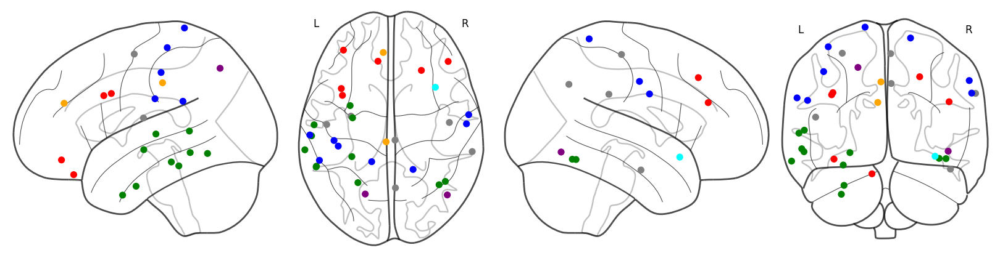

In [4]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines # For custom legend
import numpy as np
from nilearn import datasets, image, plotting

print("Fetching Harvard-Oxford atlas...")
atlas_ho = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')
atlas_ho_img = image.load_img(atlas_ho.maps)
atlas_ho_data = atlas_ho_img.get_fdata()
atlas_ho_affine = atlas_ho_img.affine
atlas_labels = atlas_ho.labels # List of region names, index 0 = 'Background'

def get_lobe_from_label(label_name):
    name = label_name.lower()
    if 'frontal' in name:
        return 'Frontal'
    if 'parietal' in name or 'postcentral' in name or 'supramarginal' in name or 'angular' in name or 'precuneus' in name:
        return 'Parietal'
    if 'temporal' in name or 'parahippocampal' in name or 'fusiform' in name or 'heschl' in name: # Heschl's Gyrus (includes primary auditory cortex)
        return 'Temporal'
    if 'occipital' in name or 'calcarine' in name or 'cuneal' in name or 'lingual' in name:
        return 'Occipital'
    if 'cingulate' in name or 'cingulum' in name:
        return 'Limbic/Cingulate'
    if 'insula' in name:
        return 'Insula'
    print(name)
    return 'Unknown/Subcortical' 

# 3. Define Lobe Colors
lobe_colors_dict = {
    'Frontal': 'red',
    'Parietal': 'blue',
    'Temporal': 'green',
    'Occipital': 'purple',
    'Limbic/Cingulate': 'orange',
    'Insula': 'cyan',
    'Subcortical': 'grey',
    'Outside Atlas': 'black' 
}

# Aggregate coordinates and determine lobe colors
all_coords = []
node_lobe_colors = []
lobes_found = set() # Keep track of which lobes are actually present

# Pre-calculate inverse affine for faster transformation
inv_affine = np.linalg.inv(atlas_ho_affine)
all_soz_labels = {}
print("Processing coordinates...")
for pid_key, soz_xyz_list_orig in all_soz_xyz.items():
    if isinstance(soz_xyz_list_orig, np.ndarray) and soz_xyz_list_orig.ndim == 1 and len(soz_xyz_list_orig) == 3:
         soz_xyz_list = [soz_xyz_list_orig] 
    elif isinstance(soz_xyz_list_orig, list) and len(soz_xyz_list_orig) > 0 and isinstance(soz_xyz_list_orig[0], (int, float)):
         soz_xyz_list = [soz_xyz_list_orig] 
    else:
         soz_xyz_list = soz_xyz_list_orig 

    if soz_xyz_list is None:
        print(f"Warning: Skipping {pid_key} due to None coordinate list.")
        continue

    for mni_coords in soz_xyz_list:
        if mni_coords is None or len(mni_coords) != 3:
            print(f"Warning: Skipping invalid coordinates for {pid_key}: {mni_coords}")
            continue

        # Convert MNI coordinate to voxel coordinate in the atlas space
        mni_coords_h = np.append(mni_coords, 1) # Add homogeneous coordinate
        voxel_coords = inv_affine @ mni_coords_h
        vx, vy, vz = map(int, np.round(voxel_coords[:3])) # Round and convert to int

        lobe = 'Outside Atlas' # Default assumption
        color = lobe_colors_dict[lobe]

        # Check if voxel coordinates are within the atlas bounds
        if (0 <= vx < atlas_ho_data.shape[0] and
            0 <= vy < atlas_ho_data.shape[1] and
            0 <= vz < atlas_ho_data.shape[2]):

            # Get the label index (value) from the atlas data
            label_index = int(atlas_ho_data[vx, vy, vz])

            # Check if the label index is valid (not background and within label list range)
            if 0 < label_index < len(atlas_labels):
                label_name = atlas_labels[label_index]
                lobe = get_lobe_from_label(label_name)
                color = lobe_colors_dict.get(lobe, lobe_colors_dict['Subcortical'])
            else:
                lobe = 'Subcortical'
                color = lobe_colors_dict[lobe]
        else:
            pass # Lobe and color remain 'Outside Atlas'
        
        all_soz_labels[pid_key] = lobe
        all_coords.append(mni_coords)
        node_lobe_colors.append(color)
        lobes_found.add(lobe) # Add the determined lobe to our set

all_coords_np = np.array(all_coords)
print(f"Plotting {len(all_coords_np)} points...")
print(f"Lobes found in data: {lobes_found}")

num_nodes = all_coords_np.shape[0]
adjacency_matrix = np.zeros((num_nodes, num_nodes))

figure = plt.figure(figsize=(16,4))

view = plotting.plot_connectome(adjacency_matrix, 
                                node_coords=all_coords_np,
                                node_size=50,
                                node_color=node_lobe_colors,
                                display_mode='lzry', 
                                figure= figure,
                                edge_threshold=None 
                                )
plt.tight_layout(rect=[0, 0, 0.85, 1]) 
plt.show()

In [5]:
all_subject_ids = np.array(list(all_soz_labels.keys()))
soz_unique_subjects = np.unique(all_run_data_soz['subject'])
print(soz_unique_subjects)
stratification_labels = np.array([all_soz_labels[sub_id] for sub_id in all_subject_ids])
print(stratification_labels)

[ 7 15 17 21 26 28 29 31 33 35 36 37 38 39 40 41 42 44 45 46 47 48 49 51
 52 53 55 57 58 59 60 61 62 63 65 69]
['Temporal' 'Temporal' 'Parietal' 'Unknown/Subcortical' 'Frontal'
 'Subcortical' 'Limbic/Cingulate' 'Temporal' 'Occipital' 'Temporal'
 'Parietal' 'Unknown/Subcortical' 'Frontal' 'Frontal' 'Frontal' 'Temporal'
 'Subcortical' 'Unknown/Subcortical' 'Unknown/Subcortical' 'Frontal'
 'Temporal' 'Parietal' 'Parietal' 'Parietal' 'Limbic/Cingulate' 'Insula'
 'Parietal' 'Temporal' 'Temporal' 'Frontal' 'Occipital' 'Parietal'
 'Parietal' 'Temporal' 'Temporal' 'Temporal']


In [6]:
from sklearn.model_selection import KFold
soz_unique_subjects = np.unique(all_run_data_soz['subject'])
kf = KFold(n_splits=5, shuffle=True, random_state=42)
folds = list(kf.split(soz_unique_subjects))
iSplit = 0


train_val_idx = np.concatenate([folds[0][1],
                            folds[1][1],
                            folds[2][1]])
val_idx = folds[3][1]

print(train_idx,val_idx)
# train_idx = np.concatenate([folds[3][1],
#                             folds[1][1],
#                             folds[2][1]])

# val_idx = folds[0][1]
# test_idx = folds[4][1]
# print(train_idx,val_idx)

train_subjects = soz_unique_subjects[train_idx]
train_no_soz_subjects = no_soz_unique_subjects
val_subjects = soz_unique_subjects[val_idx]
test_subjects = soz_unique_subjects[test_idx]

def get_subject_data(all_data,subjects,y_out=True):

    X = all_data['ecog_x']
    Xstim = all_data['stim_x']
    Xpos = all_data['ecog_pos_x']
    Xname = all_data['ecog_ch_name_x']
    y_loc_text = all_data['ecog_loc_text_y']
    y_loc_idx = all_data['ecog_loc_idx_y']
    if y_out:
        y = all_data['soz_y']
    c = all_data['condition_x']
    sids = all_data['subject']

    X_split = [] # training data
    Xstim_split = [] # training data
    Xpos_split = [] # training data 
    Xname_split = []
    y_loc_text_split = []
    y_loc_idx_split = []
    if y_out:
        y_split = [] # labels
    c_split = [] # conditions
    sids_split = [] # trial subject ids
    s_split = [] # subject info

    for subject in subjects:
        subject_trials = np.argwhere(sids == subject)[:,0]
        for iTrial in subject_trials:
            # append the data and labels
            X_split.append(X[iTrial][:,:,None])
            Xstim_split.append(Xstim[iTrial])
            Xpos_split.append(Xpos[iTrial])
            Xname_split.append(Xname[iTrial])
            y_loc_text_split.append(y_loc_text[iTrial])
            y_loc_idx_split.append(y_loc_idx[iTrial])
            if y_out:
                y_split.append(y[iTrial])
            sids_split.append(subject)

            # stack conditions into one array
            c_trial = np.concatenate((
                c['stim_xyz'][iTrial][0],
                c['stim_xyz'][iTrial][1]
            ),axis=0)
            c_split.append(c_trial)

            # subject info
            s_trial = np.concatenate((
                np.array(c['age'][iTrial])[None],
                np.array(c['sex'][iTrial])[None]
            ),axis=0)
            s_split.append(s_trial)

    if y_out:
        return X_split,Xstim_split,Xpos_split,Xname_split,y_loc_text_split,y_loc_idx_split,y_split,c_split,sids_split,s_split
    else:
        return X_split,Xstim_split,Xpos_split,Xname_split,y_loc_text_split,y_loc_idx_split,c_split,sids_split,s_split

X_train_l,Xstim_train_l, Xpos_train_l,Xname_train_l,y_loc_text_train_l,y_loc_idx_train_l, y_train_l, c_train_l,sids_train_l,s_train_l = get_subject_data(all_run_data_soz,train_subjects)
X_val,Xstim_val, Xpos_val, Xname_val,y_loc_text_val,y_loc_idx_val,y_val, c_val, sids_val,s_val = get_subject_data(all_run_data_soz,val_subjects)
X_test,Xstim_test, Xpos_test, Xname_test, y_loc_text_test, y_loc_idx_test, y_test, c_test, sids_test,s_test = get_subject_data(all_run_data_soz,test_subjects)
print(len(X_train_l))
print(len(X_val))
print(len(X_test))

[12 13 16 21 26 30 31 35  0  4  8  9 17 29 34  1  2  5 11 15 19 24] [ 3 10 22 23 27 32 33]
14126
3820
3828


### normalization

In [7]:
def all_zscore(data,data_mean=None,data_std=None):
    if data_mean is None or data_std is None:
        all_data = []
        for iTrial in range(len(data)):
            all_data.append(data[iTrial].reshape(-1))
        all_data = np.concatenate(all_data)
        data_mean = np.mean(all_data)
        data_std = np.std(all_data)

    data_z = []
    for iTrial in range(len(data)):
        data_z.append((data[iTrial] - data_mean)/data_std)
    return data_z,data_mean,data_std

def all_zscore_trial(data):
    data_z = []
    for iTrial in range(len(data)):
        data_trial_z = (data[iTrial] - np.mean(data[iTrial]))/np.std(data[iTrial])
        data_z.append(data_trial_z)
    return data_z

def all_pos_zscore(data_pos,data_mean=None,data_std=None):
    if data_mean is None or data_std is None:
        all_data = []
        for iTrial in range(len(data_pos)):
            all_data.append(data_pos[iTrial])
        all_data = np.concatenate(all_data,axis=0)
        data_mean = np.mean(all_data)# ,axis=0)
        data_std = np.std(all_data)# ,axis=0)

    data_z = []
    for iTrial in range(len(data_pos)):
        data_z.append((data_pos[iTrial] - data_mean)/data_std)
    return data_z,data_mean,data_std

def all_cond_zscore(data_pos,data_mean=None,data_std=None):
    if data_mean is None or data_std is None:
        all_data = []
        for iTrial in range(len(data_pos)):
            all_data.append(data_pos[iTrial])
        all_data = np.array(all_data)
        data_mean = np.mean(all_data)# ,axis=0)
        data_std = np.std(all_data)# ,axis=0)

    data_z = []
    for iTrial in range(len(data_pos)):
        data_z.append((data_pos[iTrial] - data_mean)/data_std)
    return data_z,data_mean,data_std

X_train_l = all_zscore_trial(X_train_l)
X_val = all_zscore_trial(X_val)
X_test = all_zscore_trial(X_test)

all_pos_data = []
for iTrial in range(len(Xpos_train_l)):
    c_pos_tiled = np.tile(c_train_l[iTrial][None,:],(Xpos_train_l[iTrial].shape[0],1))
    pos_data = np.concatenate([Xpos_train_l[iTrial],c_pos_tiled],axis=1)
    all_pos_data.append(pos_data)
all_pos_data = np.concatenate(all_pos_data,axis=0)
all_pos_data_mean = np.mean(all_pos_data)# ,axis=0)
all_pos_data_std = np.std(all_pos_data)# ,axis=0)

Xpos_train_l,_,_ = all_pos_zscore(Xpos_train_l,all_pos_data_mean,all_pos_data_std)
Xpos_val,_,_ = all_pos_zscore(Xpos_val,all_pos_data_mean,all_pos_data_std)
Xpos_test,_,_ = all_pos_zscore(Xpos_test,all_pos_data_mean,all_pos_data_std)
c_train_l,_,_ = all_pos_zscore(c_train_l,all_pos_data_mean,all_pos_data_std)
c_val,_,_ = all_pos_zscore(c_val,all_pos_data_mean,all_pos_data_std)
c_test,_,_ = all_pos_zscore(c_test,all_pos_data_mean,all_pos_data_std)

# perform overall normalization
Xstim_train_l,Xstim_train_mean,Xstim_train_std = all_zscore(Xstim_train_l)
Xstim_val,_,_ = all_zscore(Xstim_val,Xstim_train_mean,Xstim_train_std)
Xstim_test,_,_ = all_zscore(Xstim_test,Xstim_train_mean,Xstim_train_std)



## Supervised

In [10]:
import torch
from torch_geometric.data import Data, Batch
from torch_geometric.loader import DataLoader
from torch_geometric.utils import dense_to_sparse, add_self_loops, to_dense_batch, scatter
from tqdm.auto import tqdm

def create_fully_connected_edge_index(num_nodes, self_loops=False, device=None):
    adj = torch.ones((num_nodes, num_nodes), dtype=torch.uint8, device=device)
    if not self_loops:
        adj.fill_diagonal_(0)
    edge_index, _ = dense_to_sparse(adj)
    return edge_index

def create_graph_spatial_cond_data(X,Xpos,c,subject_ids,s,u,y):
    num_nodes, _, _ = X.shape
    X_tensor = torch.tensor(X,dtype=torch.float32)
    Xpos_tensor = torch.tensor(Xpos,dtype=torch.float32)
    edge_index = create_fully_connected_edge_index(num_nodes,self_loops=True)
    y_node_labels_tensor = torch.tensor(y, dtype=torch.long)
    subject_ids_tensor = torch.tensor(subject_ids,dtype=torch.float32).unsqueeze(0)
    data = Data(x=X_tensor,
                edge_index=edge_index,
                pos=Xpos_tensor,
                subject_id=subject_ids_tensor,
                y=y_node_labels_tensor)
    c_tensor = torch.tensor(c,dtype=torch.float32).unsqueeze(0)
    s_tensor = torch.tensor(s,dtype=torch.float32).unsqueeze(0)
    u_tensor = torch.tensor(u,dtype=torch.float32).unsqueeze(0)
    # y_tensor = torch.tensor(y,dtype=torch.float32).unsqueeze(0)
    return data,c_tensor,s_tensor,u_tensor

# --- DataLoader with Custom Collate ---
class CustomGraphCondDataset(torch.utils.data.Dataset):
    def __init__(self, data_cond_list):
        self.data_list = [item[0] for item in data_cond_list]
        self.condition_list = [item[1] for item in data_cond_list]
        self.subject_list = [item[2] for item in data_cond_list]
        self.input_list = [item[3] for item in data_cond_list]
    def __len__(self): 
        return len(self.data_list)
    def __getitem__(self, idx): 
        # Return data, condition, and subject_id
        x_idx = self.data_list[idx]
        c_idx = self.condition_list[idx]
        sid_idx = self.data_list[idx].subject_id
        s_idx = self.subject_list[idx]
        u_idx = self.input_list[idx]
        #y_idx = self.data_list[idx].y
        return x_idx, c_idx, sid_idx, s_idx, u_idx#, y_idx

def collate_fn(batch):
    data_items = [item[0] for item in batch]
    condition_items = [item[1] for item in batch]
    subject_id_items = [item[2] for item in batch] # Collect subject IDs
    s_items = [item[3] for item in batch] # Collect subject IDs
    u_items = [item[4] for item in batch] # Collect subject IDs
    # y_items = [item[5][:,None] for item in batch] # Collect subject IDs
    data_batch = Batch.from_data_list(data_items)
    condition_batch = torch.cat(condition_items,dim=0)
    s_batch = torch.cat(s_items,dim=0)
    u_batch = torch.cat(u_items,dim=0)
    # y_batch = Batch.from_data_list(y_items) #torch.cat(y_items,dim=0)
    return data_batch, condition_batch, subject_id_items, s_batch, u_batch # , y_batch

def create_dataset(X,Xpos,c,subject_ids,s,u,y,batch_size=64):
    # --- Create Dataset ---
    print("\nGenerating dataset with spatial info...")
    dataset = [
        create_graph_spatial_cond_data(X[iTrial],Xpos[iTrial],c[iTrial],subject_ids[iTrial],s[iTrial],u[iTrial],y[iTrial]) for iTrial in range(len(X))
    ]
    print(f"Generated {len(dataset)} graph samples.")

    custom_dataset = CustomGraphCondDataset(dataset)
    loader = DataLoader(custom_dataset,batch_size=batch_size,shuffle=True,collate_fn=collate_fn,drop_last=True)
    return loader

# set params
BATCH_SIZE = 16
_,NUM_TIMESTEPS,NODE_FEAT_DIM = X_train_l[0].shape
_,COORD_DIM = Xpos_train_l[0].shape
COND_DIM = c_train_l[0].shape[0]

train_loader = create_dataset(X_train_l,Xpos_train_l,c_train_l,sids_train_l,s_train_l,Xstim_train_l,y_train_l,batch_size=BATCH_SIZE)
val_loader = create_dataset(X_val,Xpos_val,c_val,sids_val,s_val,Xstim_val,y_val,batch_size=BATCH_SIZE)
test_loader = create_dataset(X_test,Xpos_test,c_test,sids_test,s_test,Xstim_test,y_test,batch_size=BATCH_SIZE)

label_counts = {}
total_nodes = 0
for data_batch, _, _, _, _ in tqdm(train_loader, desc="Counting Labels"):
     labels = data_batch.y.numpy() 
     for label in labels:
         label_counts[label] = label_counts.get(label, 0) + 1
     total_nodes += len(labels)

num_classes = len(label_counts)
weights = []
print(f"Label Counts: {label_counts}, Total Nodes: {total_nodes}")
for i in range(num_classes):
     count = label_counts.get(i, 1)
     weight = total_nodes / (num_classes * count)
     weights.append(weight)

class_weights = torch.tensor(weights, dtype=torch.float32)
print(f"Calculated Class Weights: {class_weights}")


Generating dataset with spatial info...
Generated 14126 graph samples.

Generating dataset with spatial info...
Generated 3820 graph samples.

Generating dataset with spatial info...
Generated 3828 graph samples.


Counting Labels:   0%|          | 0/882 [00:00<?, ?it/s]

Label Counts: {0: 512428, 1: 358015}, Total Nodes: 870443
Calculated Class Weights: tensor([0.8493, 1.2157])


In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch_geometric.nn import SAGEConv 
from torch_geometric.nn import GATConv,GATv2Conv
from torch_geometric.data import Data, Batch
from torch_geometric.loader import DataLoader
from sklearn.base import BaseEstimator, ClassifierMixin
from tqdm.auto import tqdm
from torch.optim.lr_scheduler import StepLR
import copy # Added for saving best model state in early stopping

class DelayEmbeddingTorch(nn.Module):

    def __init__(self, tau: int, M: int):
        super().__init__()
        self.tau = tau
        self.M = M

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        B, C, T = x.shape
        required_length = (self.M - 1) * self.tau + 1 # Minimum length needed for one vector
        # Calculate the number of valid embedding vectors we can create
        W = T - (self.M - 1) * self.tau # New sequence length

        output = torch.zeros(B, C, self.M, W, device=x.device, dtype=x.dtype)
        for m in range(self.M):
            time_offset = m * self.tau
            output[:, :, m, :] = x[:, :, time_offset : time_offset + W]

        embedded_output = output.permute(0, 1, 2, 3).reshape(B, C * self.M, W)
        return embedded_output

# --- TCN Block ---
class TCNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, dilation, dropout_rate):
        super().__init__()
        self.padding = (kernel_size - 1) * dilation  # Causal padding
        self.conv1 = nn.Conv1d(
            in_channels, out_channels, kernel_size,
            padding=self.padding, dilation=dilation
        )
        self.conv2 = nn.Conv1d(
            out_channels, out_channels, kernel_size,
            padding=self.padding, dilation=dilation
        )
        self.bn1 = nn.BatchNorm1d(out_channels)
        self.bn2 = nn.BatchNorm1d(out_channels)
        self.dropout = nn.Dropout(dropout_rate)
        self.residual_conv = nn.Conv1d(in_channels, out_channels, 1) if in_channels != out_channels else None

    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = F.relu(out)
        out = self.dropout(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out = F.relu(out)
        out = self.dropout(out)
        out = out[:, :, :x.shape[-1]]
        if self.residual_conv is not None:
            residual = self.residual_conv(residual)
        out = out + residual
        return out

# --- TCN Temporal Encoder ---
class TCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, num_layers, kernel_size, dropout_rate):
        super().__init__()
        self.layers = nn.ModuleList()
        dilations = [2**i for i in range(num_layers)]  # Exponential dilation
        current_channels = in_channels
        for i in range(num_layers):
            self.layers.append(
                TCNBlock(
                    in_channels=current_channels,
                    out_channels=hidden_channels,
                    kernel_size=kernel_size,
                    dilation=dilations[i],
                    dropout_rate=dropout_rate
                )
            )
            current_channels = hidden_channels

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x  

# --- Node-Level Classifier ---
class GraphNodeClassifier(nn.Module, BaseEstimator, ClassifierMixin): # Renamed class
    def __init__(self, num_classes,
                node_feature_dim,
                s_dim, u_dim,
                coord_dim, coord_embed_dim,
                temporal_hidden_dim,
                gnn_hidden_dim,
                s_embed_dim=2,
                num_temporal_layers=2,
                gat_heads=4,
                dropout_rate=0.1,
                tau=1,M=20,
                kernel_size=3,
                device=None):
        super().__init__()

        self.num_classes = num_classes
        self.node_feature_dim = node_feature_dim
        self.input_timeseries_dim = u_dim 
        self.coord_dim = coord_dim
        self.coord_embed_dim = coord_embed_dim
        self.temporal_hidden_dim = temporal_hidden_dim 
        self.gnn_hidden_dim = gnn_hidden_dim
        self.num_temporal_layers = num_temporal_layers 
        self.gat_heads = gat_heads
        self.dropout_rate = dropout_rate
        self.s_dim = s_dim
        self.s_embed_dim = s_embed_dim
        self.kernel_size = kernel_size
        self.device = device

        # --- Encoder ---
        current_x_dim = self.node_feature_dim
        current_u_dim = self.input_timeseries_dim
        self.use_dembed = tau > 0 and M > 1
        if self.use_dembed: # Account for delay embedding
            current_x_dim *= M
            current_u_dim *= M
            self.delay_embedder = DelayEmbeddingTorch(tau=tau,M=M)
        else:
            self.delay_embedder = None

        # Temporal Encoder (LSTM)
        temp_encoder_input_dim = current_x_dim # + current_u_dim #self.node_feature_dim#  + self.input_timeseries_dim
        # if kernel_size > 0:
        self.tcn_encoder = TCNEncoder(
            in_channels=temp_encoder_input_dim,
            hidden_channels=self.temporal_hidden_dim,
            num_layers=self.num_temporal_layers,
            kernel_size=kernel_size,
            dropout_rate= self.dropout_rate # dropout_rate
        )

        # Condition/Coordinate Embedders
        self.c_embedder = nn.Sequential(
            nn.Linear(3*self.coord_dim, 2*self.coord_embed_dim),
            nn.ReLU(),
            nn.Dropout(self.dropout_rate),
            nn.Linear(2*self.coord_embed_dim, self.coord_embed_dim) # Use self.num_classes
        )
        # Subject Embedder
        self.s_embedder = nn.Sequential(
            nn.Linear(self.s_dim, self.s_embed_dim), # Use self.s_dim
            nn.ReLU()
        )

        # Spatial Encoder (GNN - GAT)
        gnn_input_dim = (2 * self.num_temporal_layers * self.temporal_hidden_dim) 
        gnn_input_dim = 2 *self.temporal_hidden_dim  + self.coord_embed_dim#  + self.coord_embed_dim # 2*

        if self.gnn_hidden_dim % self.gat_heads != 0:
            print(f"Warning: gnn_hidden_dim ({self.gnn_hidden_dim}) not divisible by gat_heads ({self.gat_heads}). Adjusting.")
            self.gnn_hidden_dim = (self.gnn_hidden_dim // self.gat_heads) * self.gat_heads
            if self.gnn_hidden_dim == 0: raise ValueError("gnn_hidden_dim too small for number of heads")

        self.gat_conv1 = GATv2Conv(gnn_input_dim, self.gnn_hidden_dim // self.gat_heads,
                                heads=self.gat_heads, dropout=self.dropout_rate, concat=True)

        # --- Node-Level Classifier Head ---
        classifier_input_dim = self.gnn_hidden_dim + 2*self.temporal_hidden_dim +  self.coord_embed_dim# 2* 2*self.temporal_hidden_dim
        self.classifier_head = nn.Sequential(
            nn.Linear(classifier_input_dim, classifier_input_dim // 2),
            nn.ReLU(),
            nn.Dropout(self.dropout_rate),
            nn.Linear(classifier_input_dim  // 2, self.num_classes) # Use self.num_classes
        )

        # Store classes_ for sklearn compatibility
        self.classes_ = torch.arange(self.num_classes)

    def _get_node_embeddings(self, data, c, s, u, return_attention=False):
        x, edge_index, batch, pos = data.x, data.edge_index, data.batch, data.pos
        u = u.squeeze(1)
        c = c.squeeze(1)

        # --- Temporal Encoding ---
        x_embed = x
        if self.use_dembed:
            x_embed = self.delay_embedder(x_embed.permute(0, 2, 1)).permute(0, 2, 1)
        else:
            x_embed = x_embed
        temporal_input = x_embed.permute(0, 2, 1) 
        temporal_output = self.tcn_encoder(temporal_input) 
        node_embeddings_max = F.adaptive_max_pool1d(temporal_output, 1).squeeze(-1)
        node_embeddings_avg = F.adaptive_avg_pool1d(temporal_output, 1).squeeze(-1)
        node_embeddings_temporal = torch.cat((node_embeddings_max, node_embeddings_avg), dim=1)

        # --- Combine Pos + Condition ---
        if return_attention:
            c_batch = c.repeat(len(pos),1)
            c_embed_input = torch.cat([pos,c_batch], dim=1)

        else:
            c_embed_input = torch.cat([pos, c[batch]], dim=1)
        coord_embeddings = self.c_embedder(c_embed_input)

        # --- GNN Input ---
        gnn_input_features = torch.cat([node_embeddings_temporal, coord_embeddings], dim=1)

        # --- Apply GNN Layers ---
        attention_weights_l1 = None # Initialize
        if return_attention:
            node_embeddings_spatial, (edge_index_att,attention_weights_l1) = self.gat_conv1(
                gnn_input_features, edge_index, return_attention_weights=True
            )
        else:
            node_embeddings_spatial = self.gat_conv1(gnn_input_features,edge_index)
        node_embeddings = torch.cat([node_embeddings_spatial,node_embeddings_temporal,coord_embeddings],dim=1) 

        # --- Return final node embeddings (and optionally attention) ---
        if return_attention:
            return node_embeddings, edge_index_att, attention_weights_l1
        else:
            return node_embeddings
        
    def forward(self, data, c, s, u):
        node_embeddings = self._get_node_embeddings(data,c,s,u,return_attention=False)
        node_logits = self.classifier_head(node_embeddings)
        return node_logits

    @torch.no_grad() 
    def get_attention_weights(self, data, c, s, u):
         self.eval() #
         data = data.to(self.device)
         c = c.to(self.device)
         s = s.to(self.device)
         u = u.to(self.device)
         _, edge_index_att, attention_weights_l1 = self._get_node_embeddings(
             data, c, s, u, return_attention=True
         )
         return edge_index_att, attention_weights_l1

    def fit(self, train_loader, val_loader=None,
            epochs=10, learning_rate=1e-4,
            weight_decay=0, device=None,step_size=0,
            optimizer_class=optim.Adam,class_weights=None,
            early_stopping_patience=2,
            early_stopping_metric='val_loss'):
        
        from sklearn.metrics import average_precision_score
        from sklearn.metrics import roc_auc_score
        if device is None:
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(device)

        optimizer = optimizer_class(self.parameters(), lr=learning_rate, weight_decay=weight_decay)
        if step_size > 0:
            scheduler = StepLR(optimizer,step_size=step_size,gamma=0.2)

        weights_tensor = class_weights.to(device) if class_weights is not None else None
        criterion = nn.CrossEntropyLoss(weight=weights_tensor)

        # Early Stopping setup
        best_metric_value = np.inf
        epochs_without_improvement = 0
        best_model_state_dict = None
        if val_loader is None and early_stopping_patience <= epochs:
            print("Warning: Validation loader not provided. Early stopping disabled.")
            early_stopping_patience = epochs + 1 # Effectively disable
        if early_stopping_patience <= epochs: print(f"Early Stopping: Patience={early_stopping_patience}, Metric={early_stopping_metric}")


        print(f"--- Starting Node Classification Training on {device} ---")
        for epoch in range(1, epochs + 1):
            self.train()
            train_loss = 0
            train_correct = 0
            train_total = 0
            pbar_train = tqdm(train_loader, desc=f"Epoch {epoch}/{epochs} [Train]", leave=False, unit="batch")
            all_train_probas = []
            all_train_labels = []
            # --- Data Loading ---
            for data_batch, condition_batch, _, s_batch, u_batch in pbar_train:
                data_batch = data_batch.to(device) # PyG Batch object
                condition_batch = condition_batch.to(device)
                u_batch = u_batch.to(device)
                s_batch = s_batch.to(device) 
                y_batch = data_batch.y.to(device)

                # --- Forward Pass ---
                optimizer.zero_grad()
                node_logits = self(data_batch, condition_batch, s_batch, u_batch) 

                # --- Loss Calculation ---
                loss = criterion(node_logits, y_batch)

                # --- Backpropagation ---
                loss.backward()

                torch.nn.utils.clip_grad_norm_(self.parameters(), max_norm=10.0) 
                optimizer.step()

                # --- Logging ---
                train_loss += loss.item()
                preds = torch.argmax(node_logits, dim=1)
                train_correct += (preds == y_batch).sum().item()
                train_total += y_batch.size(0)
                pbar_train.set_postfix({"Loss": f"{loss.item():.4f}"})
                probas = F.softmax(node_logits, dim=1)
                probas_positive = probas[:, 1].cpu().detach().numpy()  # Probability of positive class
                all_train_probas.extend(probas_positive)
                all_train_labels.extend(y_batch.cpu().numpy())
                pbar_train.set_postfix({"Loss": f"{loss.item():.4f}"})


            train_auroc = roc_auc_score(all_train_labels, all_train_probas)
            train_auprc = average_precision_score(all_train_labels, all_train_probas)
            train_loss /= len(pbar_train) if len(pbar_train) > 0 else 1
            train_acc = train_correct / train_total if train_total > 0 else 0

            log_msg = f"Epoch {epoch}/{epochs} | Train Loss: {train_loss:.4f}, Train AUROC: {train_auroc:.4f}, Train AUPRC: {train_auprc:.4f}"

            # --- Validation ---
            current_metric_value = None
            if val_loader:
                all_val_probas = []
                all_val_labels = []
                self.eval()
                val_loss = 0
                val_correct = 0
                val_total = 0
                with torch.no_grad():
                    pbar_val = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]", leave=False, unit="batch")
                    for data_batch, condition_batch, _, s_batch, u_batch in pbar_val:
                        data_batch = data_batch.to(device)
                        condition_batch = condition_batch.to(device)
                        u_batch = u_batch.to(device)
                        s_batch = s_batch.to(device)
                        y_batch = data_batch.y.to(device) 

                        node_logits = self(data_batch, condition_batch, s_batch, u_batch)
                        loss = criterion(node_logits, y_batch)

                        val_loss += loss.item()
                        preds = torch.argmax(node_logits, dim=1)
                        val_correct += (preds == y_batch).sum().item()
                        val_total += y_batch.size(0)
                        # Collect probabilities for AUPRC
                        probas = F.softmax(node_logits, dim=1)
                        probas_positive = probas[:, 1].cpu().numpy()  # Probability of positive class (Class 1)
                        all_val_probas.extend(probas_positive)
                        all_val_labels.extend(y_batch.cpu().numpy())


                val_auroc = roc_auc_score(all_val_labels, all_val_probas)


                val_loss /= len(pbar_val) if len(pbar_val) > 0 else 1
                val_auprc = average_precision_score(all_val_labels, all_val_probas)
                val_acc = val_correct / val_total if val_total > 0 else 0
                log_msg += f" | Val Loss: {val_loss:.4f}, Val AUROC: {val_auroc:.4f}, Val AUPRC: {val_auprc:.4f}"
            
                # --- Check Early Stopping Condition ---
                if early_stopping_patience <= epochs:
                    if early_stopping_metric == 'val_loss':
                        current_metric_value = val_loss
                    elif early_stopping_metric == 'val_auroc':
                        current_metric_value = val_auroc
                    elif early_stopping_metric == 'val_auprc':
                        current_metric_value = val_auprc

                    if (current_metric_value < best_metric_value):
                        best_metric_value = current_metric_value
                        epochs_without_improvement = 0
                        # Save the best model state
                        best_model_state_dict = copy.deepcopy(self.state_dict())
                        log_msg += " (New best!)"
                    else:
                        epochs_without_improvement += 1
                        log_msg += f" (ES patience: {epochs_without_improvement}/{early_stopping_patience})"

            if step_size > 0:
                scheduler.step()
            print(log_msg)

            # --- Trigger Early Stopping ---
            if epochs_without_improvement >= early_stopping_patience:
                print(f"\n--- Early stopping triggered after {epoch} epochs ---")
                print(f"Best {early_stopping_metric}: {best_metric_value:.4f}")
                # Load the best model state found during training
                if best_model_state_dict:
                    self.load_state_dict(best_model_state_dict)
                    print("Loaded best model weights.")
                else:
                     print("Warning: Early stopping triggered, but no best model state was saved.")
                break 

        # --- End of Training ---
        if epochs_without_improvement < early_stopping_patience and best_model_state_dict is not None:
             print("\n--- Training finished ---")
             print(f"Loading best model weights (Best {early_stopping_metric}: {best_metric_value:.4f})")
             self.load_state_dict(best_model_state_dict)
        elif epochs_without_improvement >= early_stopping_patience:
             pass # Message already printed during early stopping break
        else:
             print("\n--- Training finished (No validation/early stopping or no improvement found) ---")

        return self

    def predict(self, loader, device=None):
        if device is None: device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(device)
        self.eval()
        all_preds = []
        with torch.no_grad():
            pbar_pred = tqdm(loader, desc="Predicting Node Labels", leave=False, unit="batch")
            for data_batch, condition_batch, _, s_batch, u_batch in pbar_pred:
                data_batch = data_batch.to(device)
                condition_batch = condition_batch.to(device)
                u_batch = u_batch.to(device)
                s_batch = s_batch.to(device)

                node_logits = self(data_batch, condition_batch, s_batch, u_batch)
                preds = torch.argmax(node_logits, dim=1)
                all_preds.append(preds.cpu())

        return torch.cat(all_preds).numpy()

    def predict_proba(self, loader, device=None):
        if device is None: device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(device)
        self.eval()
        all_probas = []
        with torch.no_grad():
            pbar_pred = tqdm(loader, desc="Predicting Node Probabilities", leave=False, unit="batch")
            for data_batch, condition_batch, _, s_batch, u_batch in pbar_pred:
                data_batch = data_batch.to(device)
                condition_batch = condition_batch.to(device)
                u_batch = u_batch.to(device)
                s_batch = s_batch.to(device)

                node_logits = self(data_batch, condition_batch, s_batch, u_batch)
                probas = F.softmax(node_logits, dim=1)
                all_probas.append(probas.cpu())

        return torch.cat(all_probas).numpy()

# --- Model Hyperparameters ---
COORD_EMBED_DIM = 8 # #8 # 8 # 8
GNN_HIDDEN = 64 # 64
# GNN_HIDDEN = 64 # 128 #32
GAT_HEADS = 1 #E 4 # 4
TEMPORAL_HIDDEN = 32  # // 2
NUM_LSTM_LAYERS = 7 #6
KERNEL_SIZE = 3 # 0# 3
# --- Training Hyperparameters ---
EPOCHS = 12 # 
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

graph_clf = GraphNodeClassifier(
    num_classes=2,node_feature_dim=NODE_FEAT_DIM,
    s_dim=2,u_dim=2,coord_dim=COORD_DIM,coord_embed_dim=COORD_EMBED_DIM,
    temporal_hidden_dim=TEMPORAL_HIDDEN, gnn_hidden_dim=GNN_HIDDEN,
    num_temporal_layers=NUM_LSTM_LAYERS,gat_heads=GAT_HEADS,
    dropout_rate=0.4,device=DEVICE,tau=2,M=30,kernel_size=KERNEL_SIZE
)

graph_clf.fit(
    train_loader=train_loader,val_loader=val_loader,
    epochs=EPOCHS,learning_rate=5e-4,weight_decay=1e-3,step_size=0, # 5e-4
    device=DEVICE,optimizer_class=optim.Adam,class_weights=class_weights
)
print("\n--- Training finished ---")

Using device: cuda
Early Stopping: Patience=2, Metric=val_loss
--- Starting Node Classification Training on cuda ---


Epoch 1/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 1/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 1/12 | Train Loss: 0.6888, Train AUROC: 0.5796, Train AUPRC: 0.4787 | Val Loss: 0.6392, Val AUROC: 0.6378, Val AUPRC: 0.3715 (New best!)


Epoch 2/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 2/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 2/12 | Train Loss: 0.6475, Train AUROC: 0.6738, Train AUPRC: 0.5892 | Val Loss: 0.6308, Val AUROC: 0.6710, Val AUPRC: 0.4211 (New best!)


Epoch 3/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 3/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 3/12 | Train Loss: 0.6194, Train AUROC: 0.7181, Train AUPRC: 0.6370 | Val Loss: 0.6147, Val AUROC: 0.6736, Val AUPRC: 0.4144 (New best!)


Epoch 4/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 4/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 4/12 | Train Loss: 0.6063, Train AUROC: 0.7348, Train AUPRC: 0.6557 | Val Loss: 0.6102, Val AUROC: 0.6875, Val AUPRC: 0.4417 (New best!)


Epoch 5/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 5/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 5/12 | Train Loss: 0.5913, Train AUROC: 0.7528, Train AUPRC: 0.6754 | Val Loss: 0.5720, Val AUROC: 0.7308, Val AUPRC: 0.4631 (New best!)


Epoch 6/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 6/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 6/12 | Train Loss: 0.5776, Train AUROC: 0.7677, Train AUPRC: 0.6917 | Val Loss: 0.5684, Val AUROC: 0.7380, Val AUPRC: 0.4674 (New best!)


Epoch 7/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 7/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 7/12 | Train Loss: 0.5668, Train AUROC: 0.7783, Train AUPRC: 0.7034 | Val Loss: 0.5566, Val AUROC: 0.7430, Val AUPRC: 0.4671 (New best!)


Epoch 8/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 8/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 8/12 | Train Loss: 0.5529, Train AUROC: 0.7912, Train AUPRC: 0.7183 | Val Loss: 0.5567, Val AUROC: 0.7434, Val AUPRC: 0.4850 (ES patience: 1/2)


Epoch 9/12 [Train]:   0%|          | 0/882 [00:00<?, ?batch/s]

Epoch 9/12 [Val]:   0%|          | 0/238 [00:00<?, ?batch/s]

Epoch 9/12 | Train Loss: 0.5411, Train AUROC: 0.8016, Train AUPRC: 0.7314 | Val Loss: 0.5680, Val AUROC: 0.7298, Val AUPRC: 0.4672 (ES patience: 2/2)

--- Early stopping triggered after 9 epochs ---
Best val_loss: 0.5566
Loaded best model weights.

--- Training finished ---


DataBatch(x=[1003, 508, 1], edge_index=[2, 68125], y=[1003], pos=[1003, 3], subject_id=[16], batch=[1003], ptr=[17]) torch.Size([16, 1, 6])
Data(x=[57, 508, 1], edge_index=[2, 3249], y=[57], pos=[57, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([3249, 1])
Corresponding edge_index shape: torch.Size([2, 3249])


C:\Users\tyler_p5hze3w\AppData\Local\Temp\ipykernel_30740\2153120604.py:61: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(


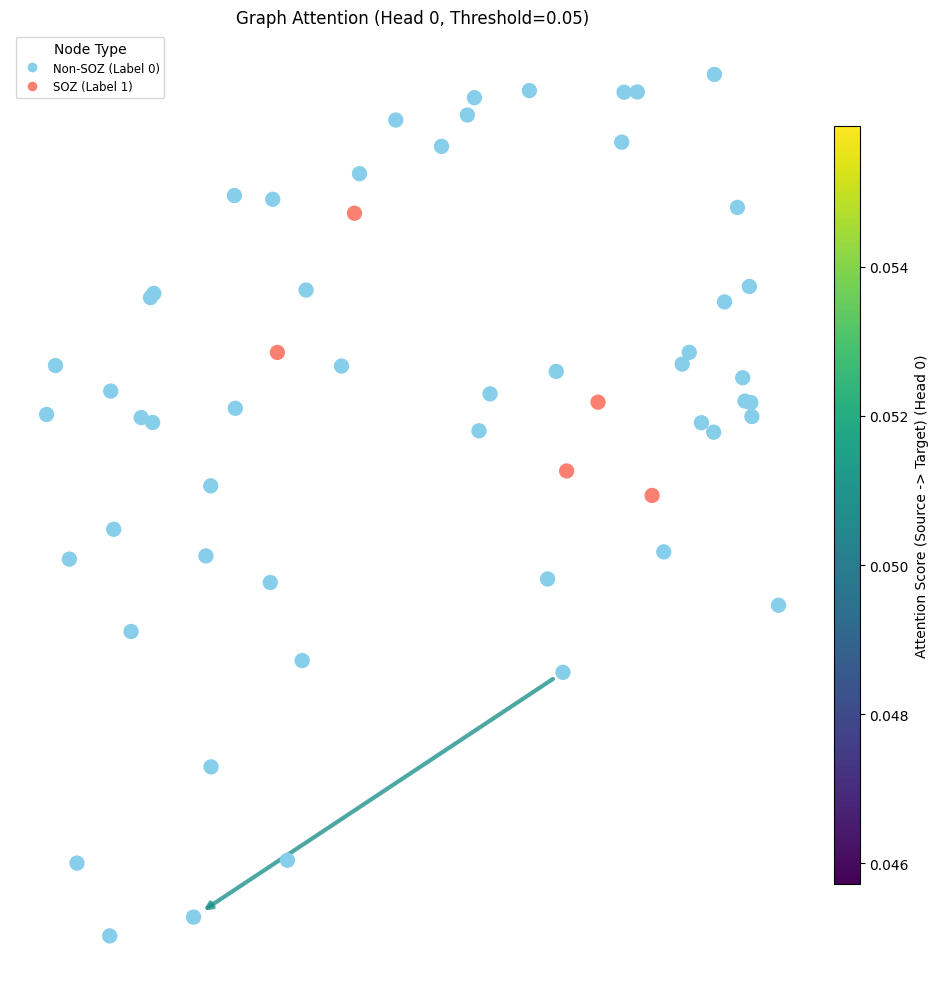

Data(x=[84, 508, 1], edge_index=[2, 7056], y=[84], pos=[84, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([7056, 1])
Corresponding edge_index shape: torch.Size([2, 7056])


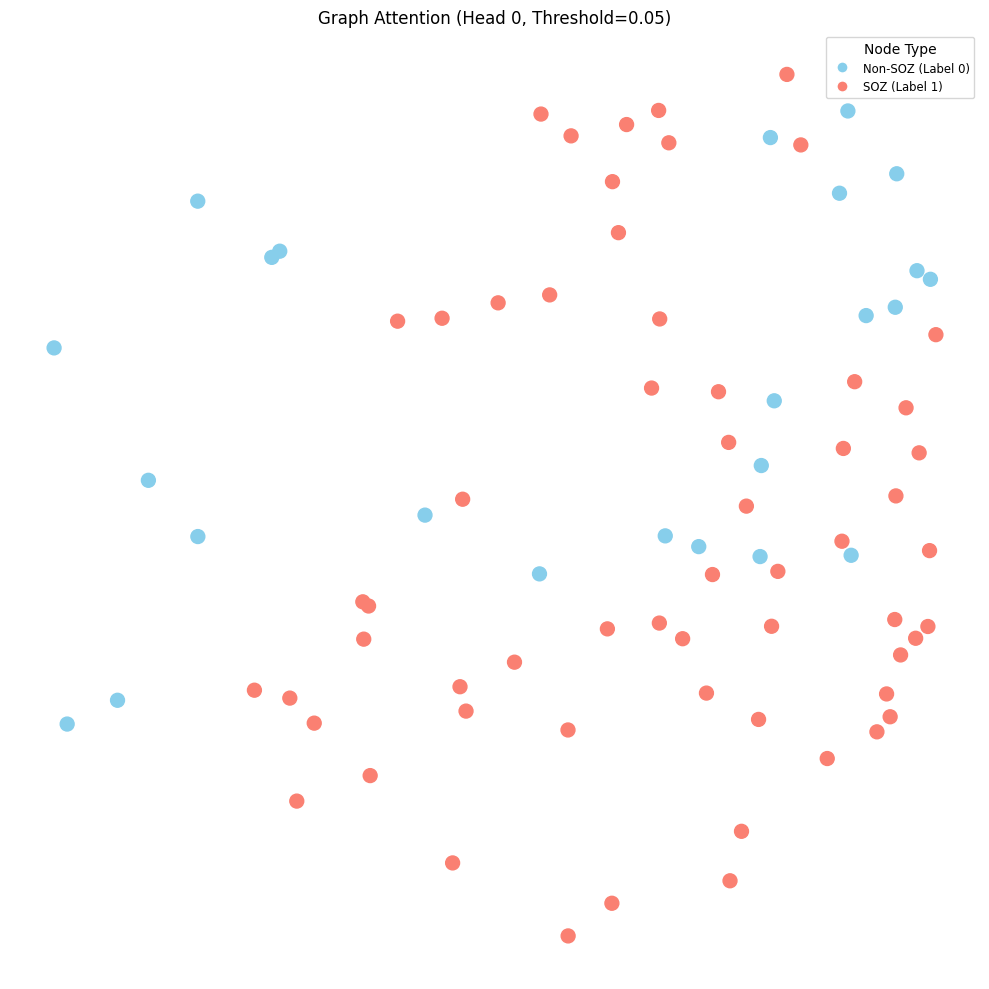

Data(x=[54, 508, 1], edge_index=[2, 2916], y=[54], pos=[54, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([2916, 1])
Corresponding edge_index shape: torch.Size([2, 2916])


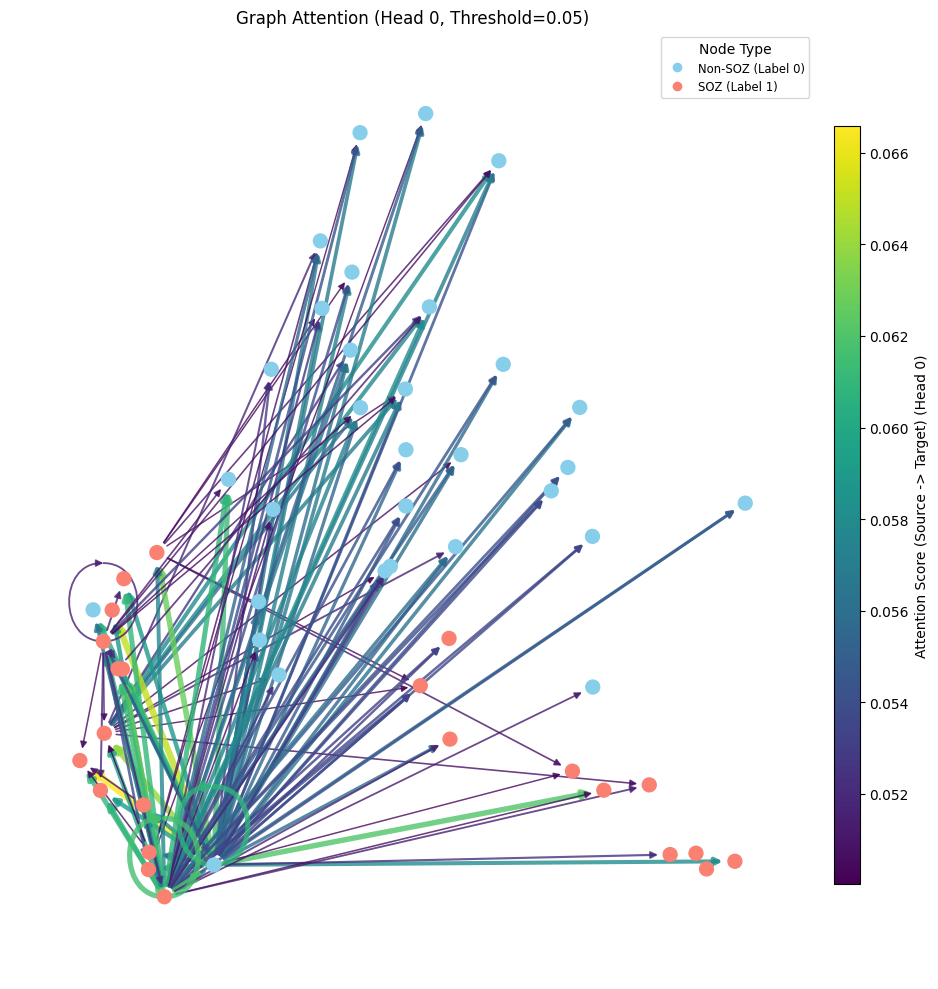

Data(x=[56, 508, 1], edge_index=[2, 3136], y=[56], pos=[56, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([3136, 1])
Corresponding edge_index shape: torch.Size([2, 3136])


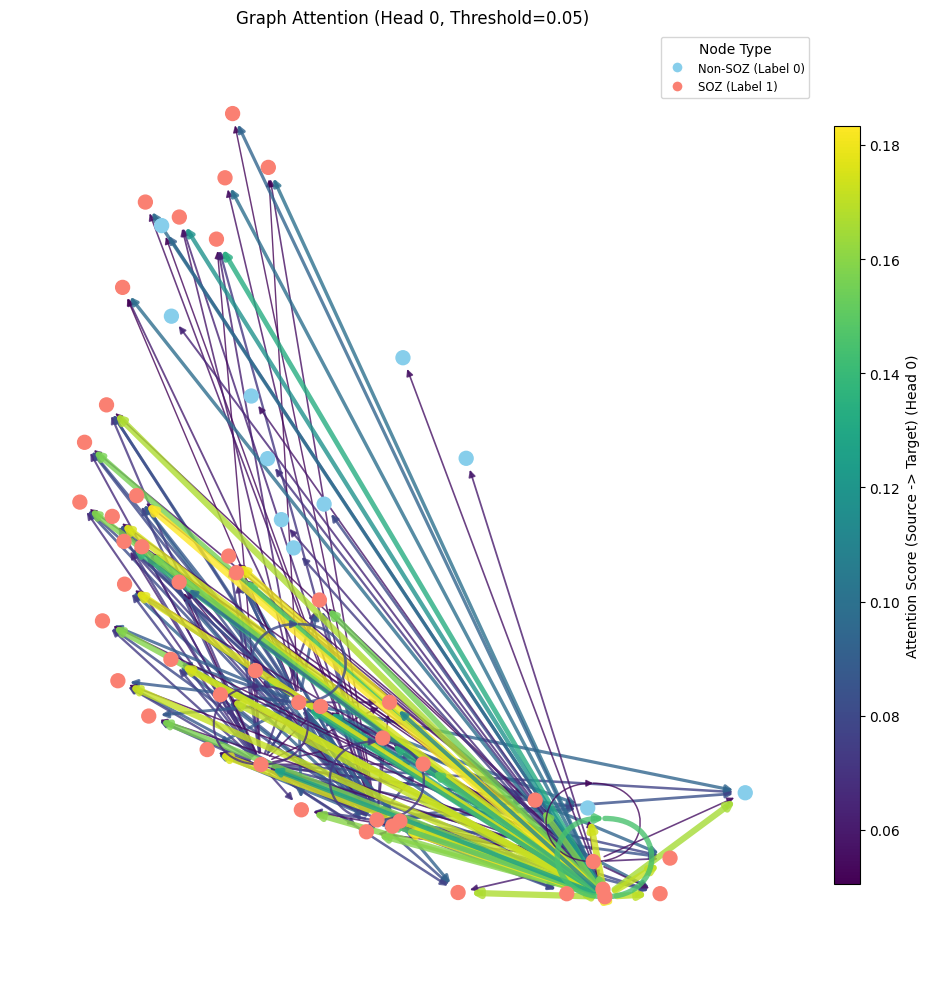

Data(x=[49, 508, 1], edge_index=[2, 2401], y=[49], pos=[49, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([2401, 1])
Corresponding edge_index shape: torch.Size([2, 2401])


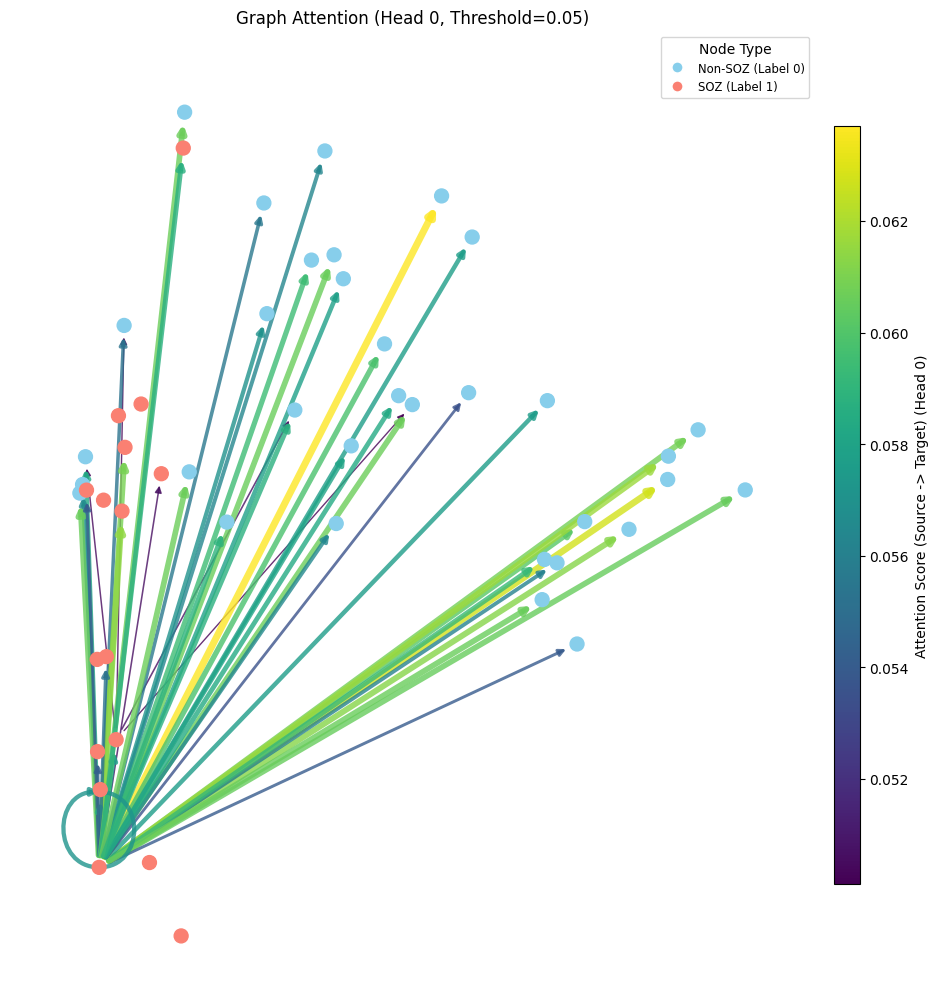

Data(x=[51, 508, 1], edge_index=[2, 2601], y=[51], pos=[51, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([2601, 1])
Corresponding edge_index shape: torch.Size([2, 2601])


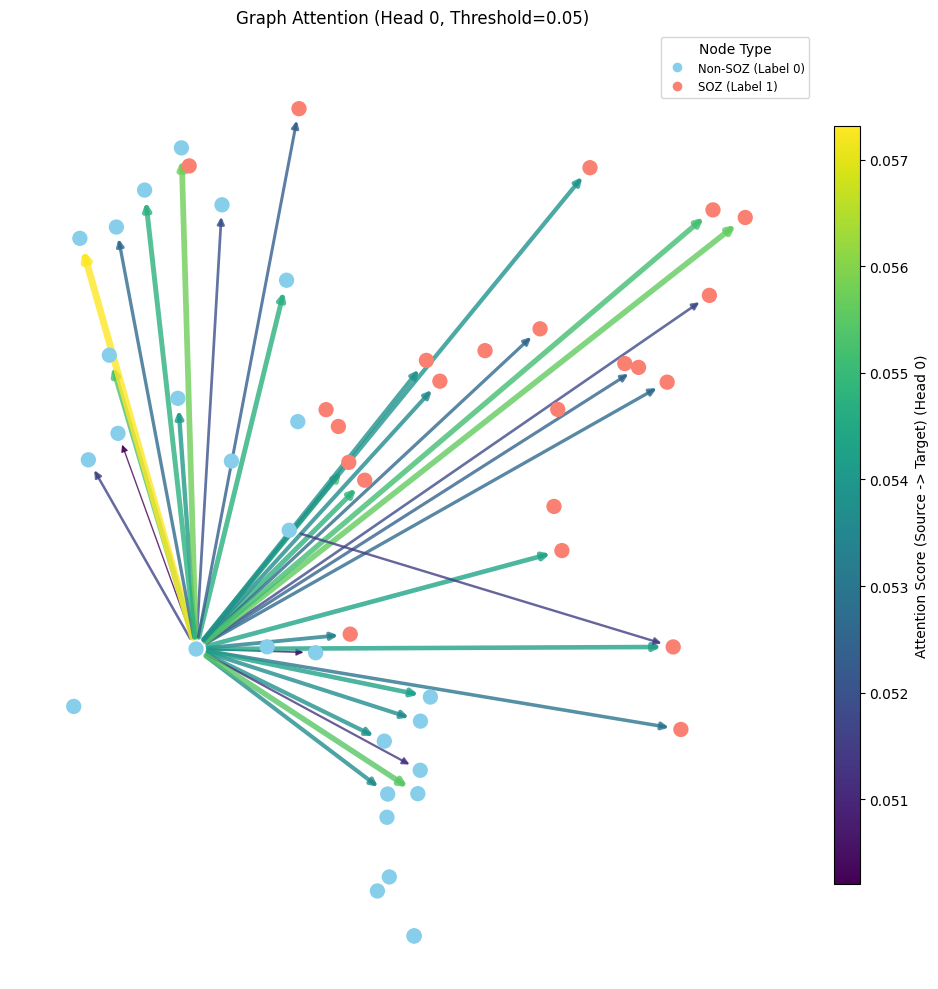

Data(x=[48, 508, 1], edge_index=[2, 2304], y=[48], pos=[48, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([2304, 1])
Corresponding edge_index shape: torch.Size([2, 2304])


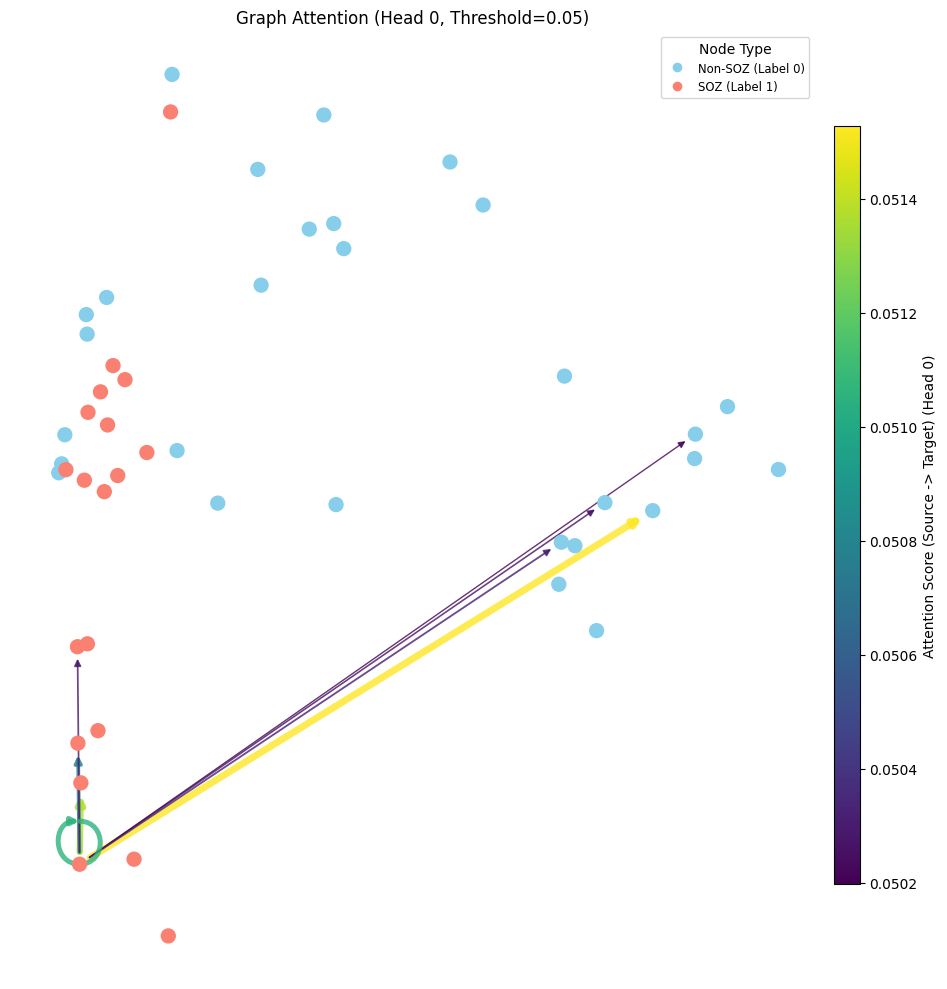

Data(x=[73, 508, 1], edge_index=[2, 5329], y=[73], pos=[73, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([5329, 1])
Corresponding edge_index shape: torch.Size([2, 5329])


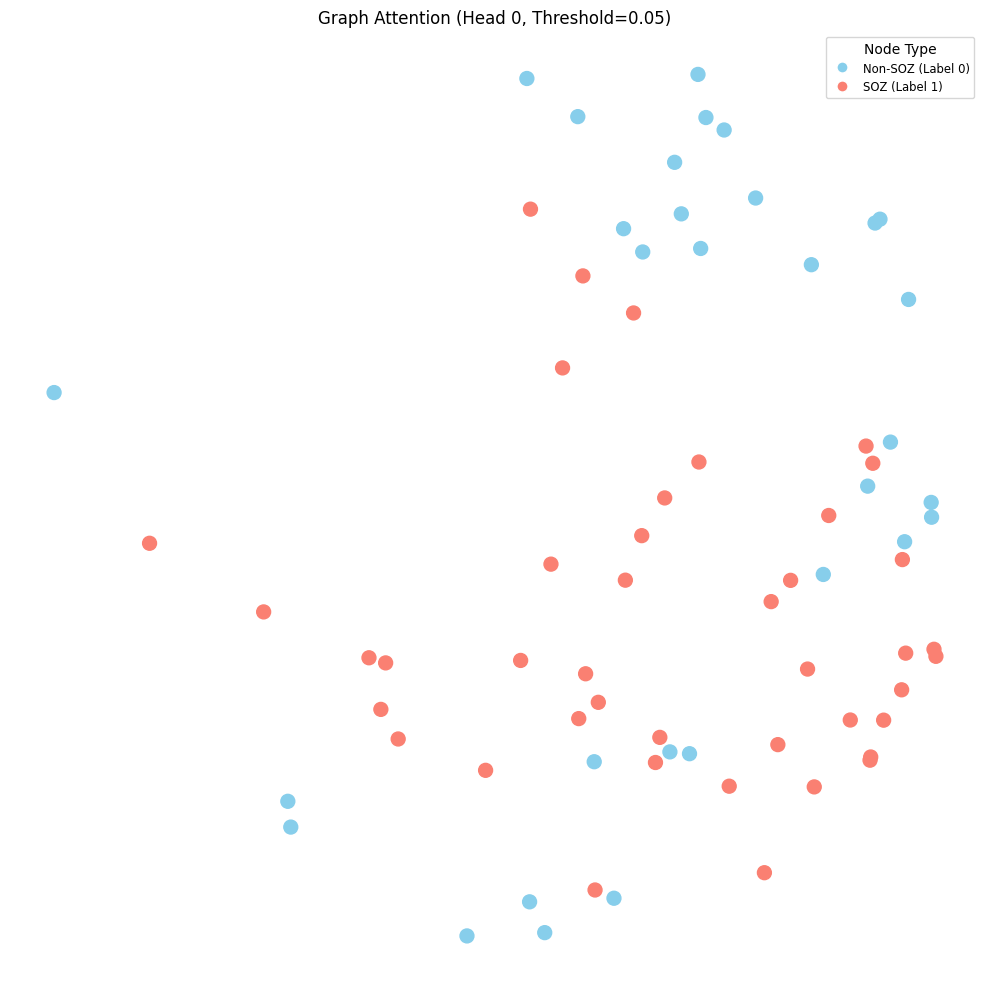

Data(x=[49, 508, 1], edge_index=[2, 2401], y=[49], pos=[49, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([2401, 1])
Corresponding edge_index shape: torch.Size([2, 2401])


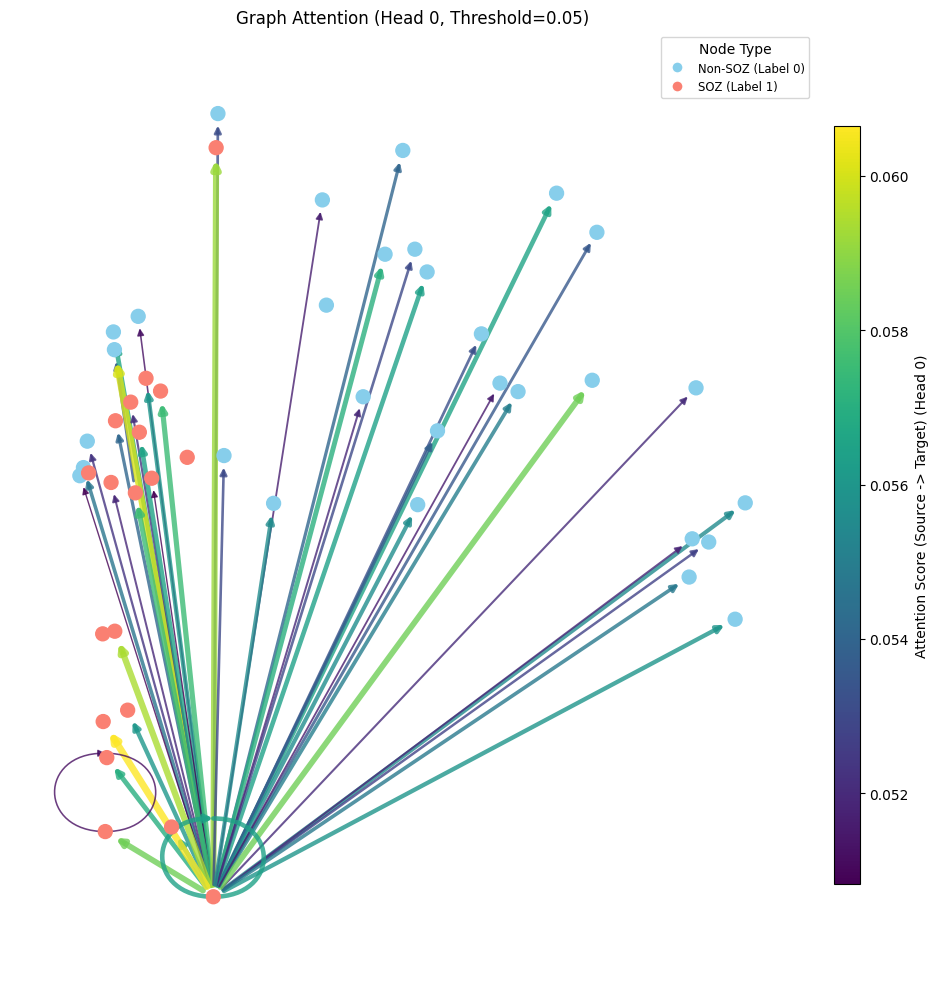

Data(x=[85, 508, 1], edge_index=[2, 7225], y=[85], pos=[85, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([7225, 1])
Corresponding edge_index shape: torch.Size([2, 7225])


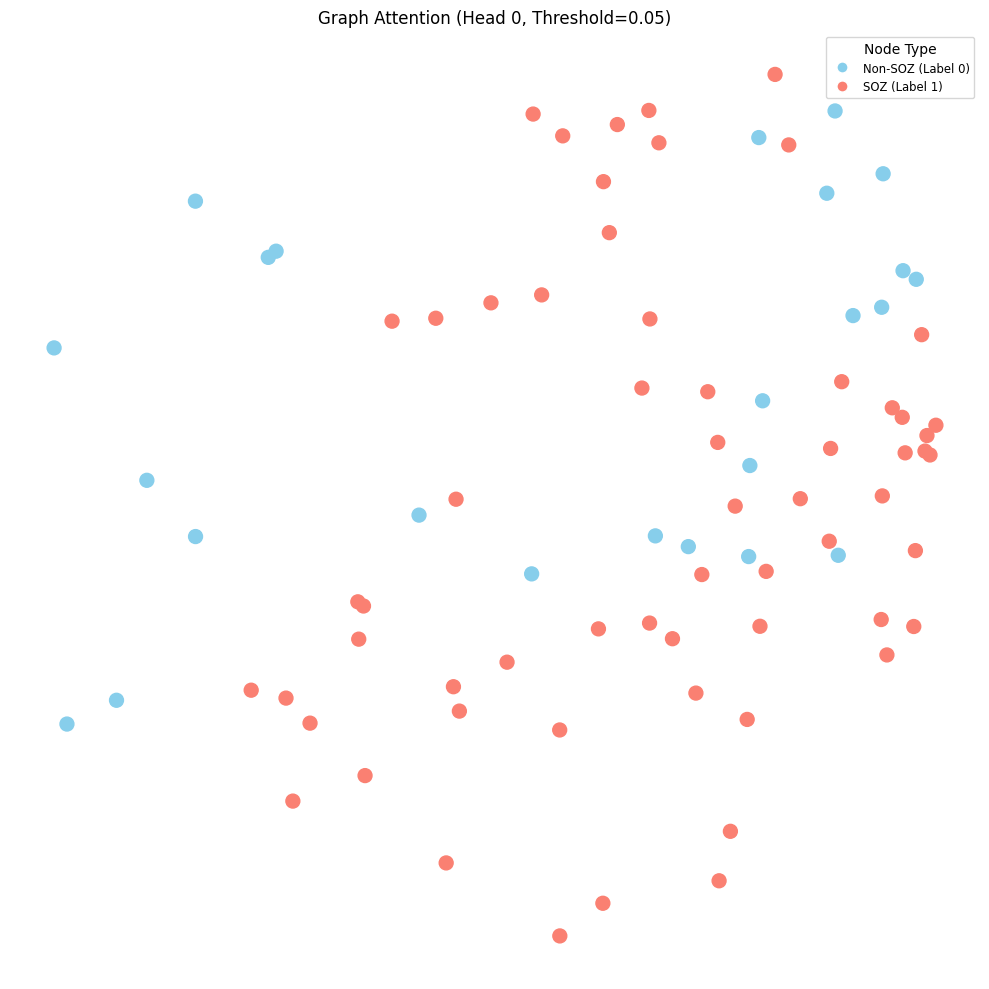

Data(x=[107, 508, 1], edge_index=[2, 11449], y=[107], pos=[107, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([11449, 1])
Corresponding edge_index shape: torch.Size([2, 11449])


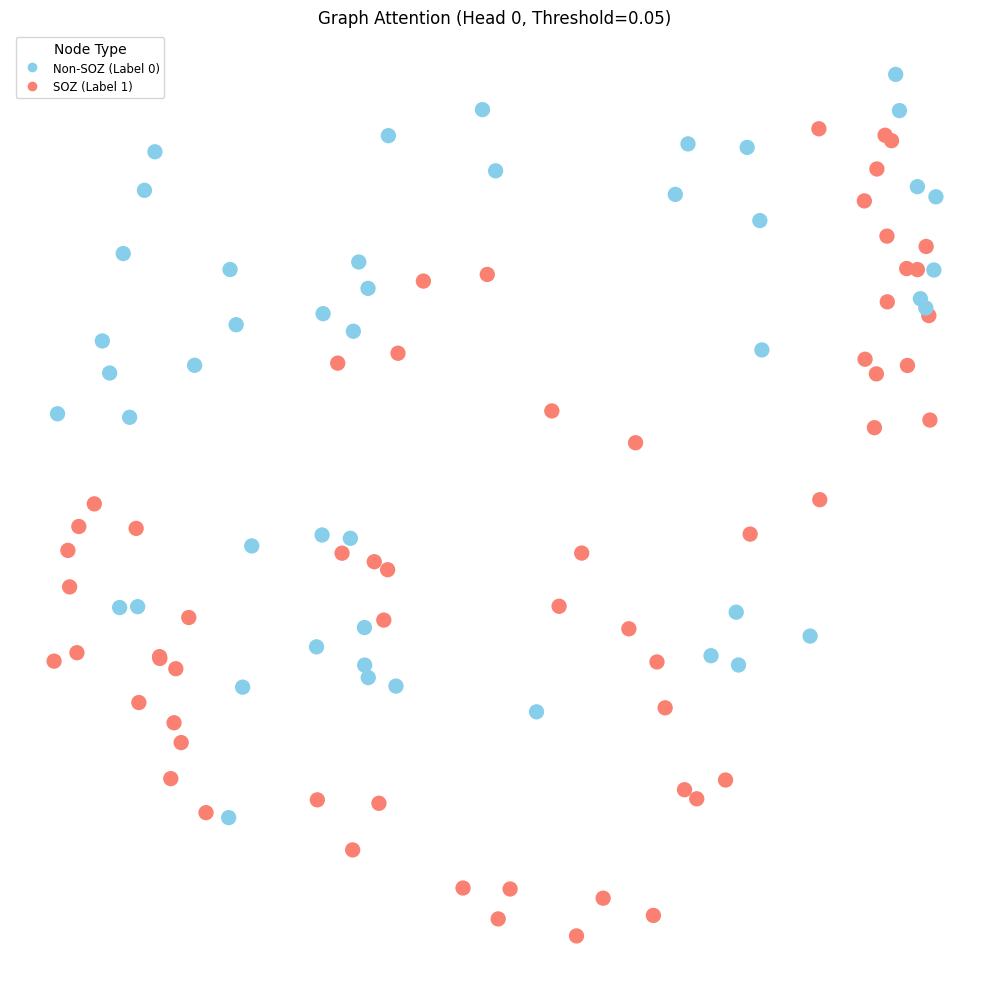

Data(x=[54, 508, 1], edge_index=[2, 2916], y=[54], pos=[54, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([2916, 1])
Corresponding edge_index shape: torch.Size([2, 2916])


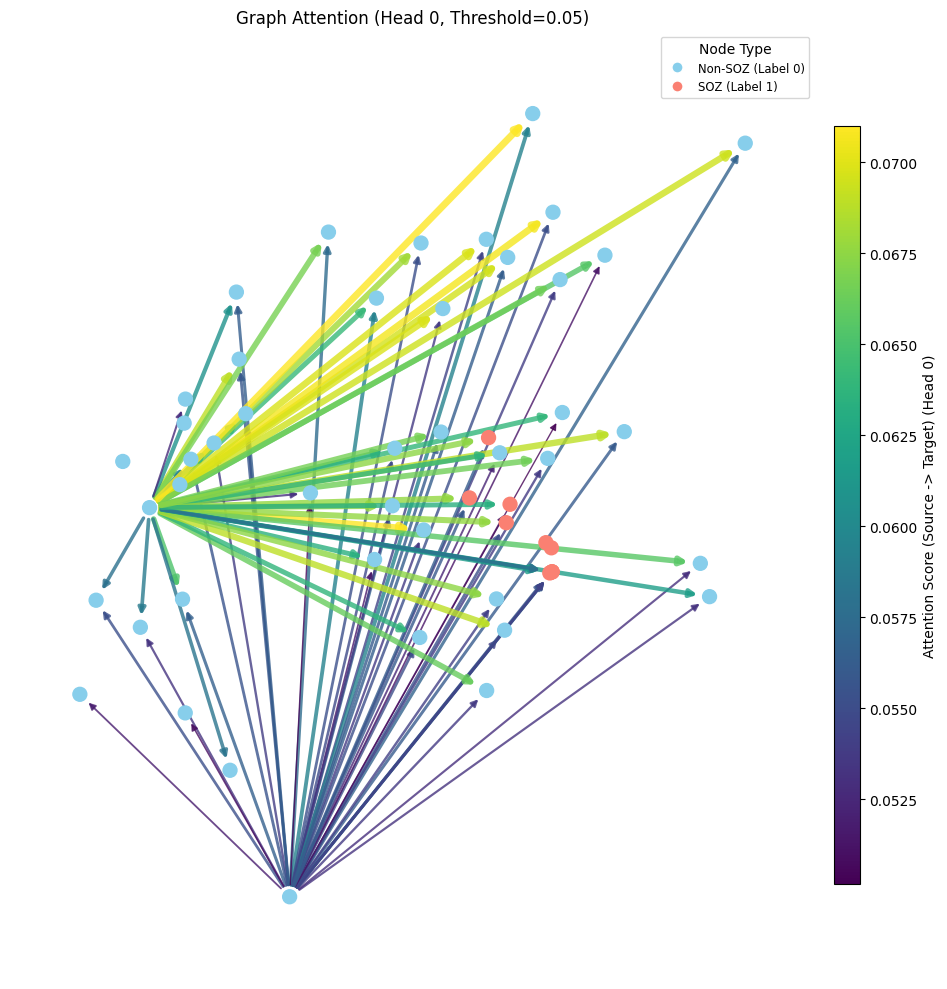

Data(x=[37, 508, 1], edge_index=[2, 1369], y=[37], pos=[37, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([1369, 1])
Corresponding edge_index shape: torch.Size([2, 1369])


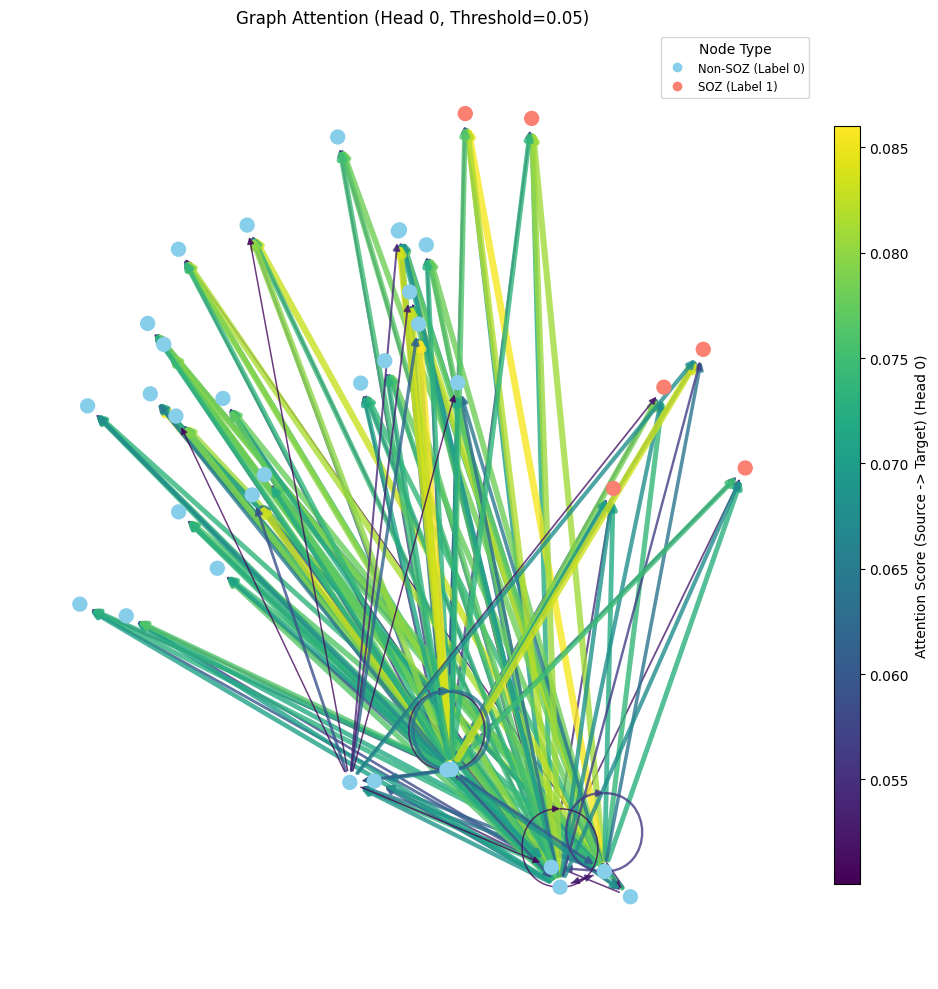

Data(x=[52, 508, 1], edge_index=[2, 2704], y=[52], pos=[52, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([2704, 1])
Corresponding edge_index shape: torch.Size([2, 2704])


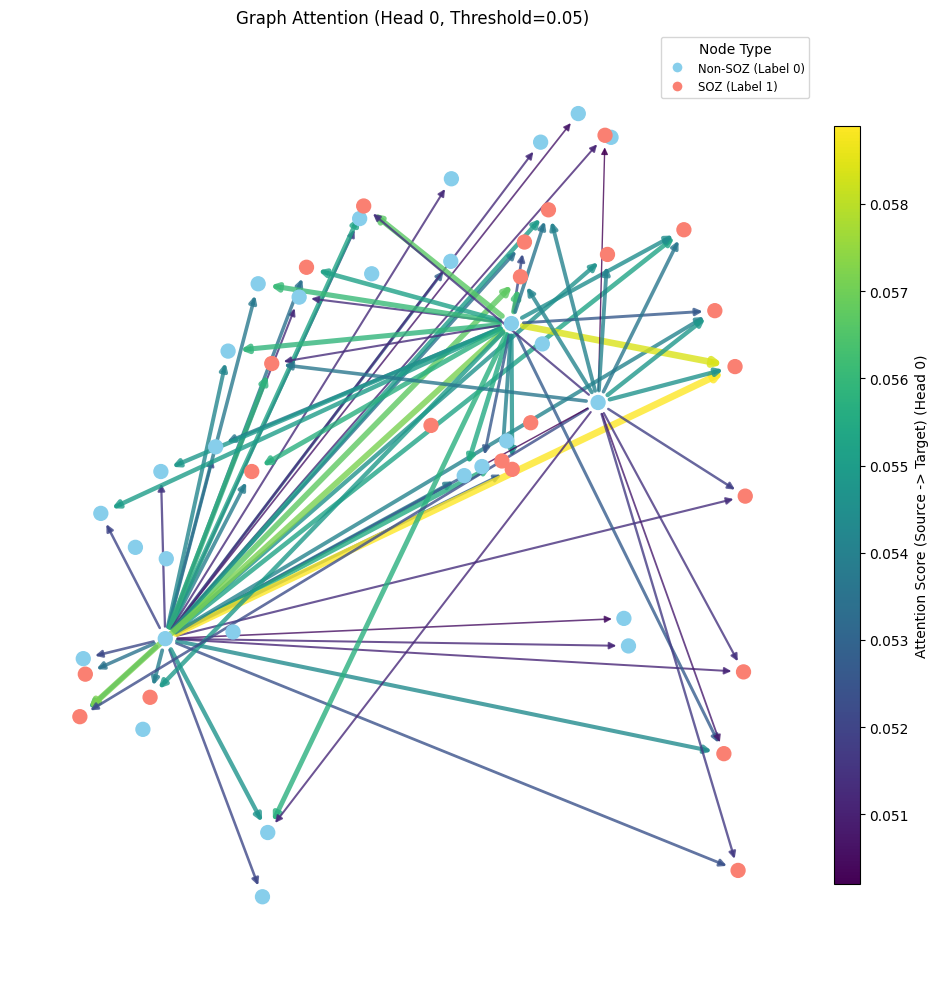

Data(x=[62, 508, 1], edge_index=[2, 3844], y=[62], pos=[62, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([3844, 1])
Corresponding edge_index shape: torch.Size([2, 3844])


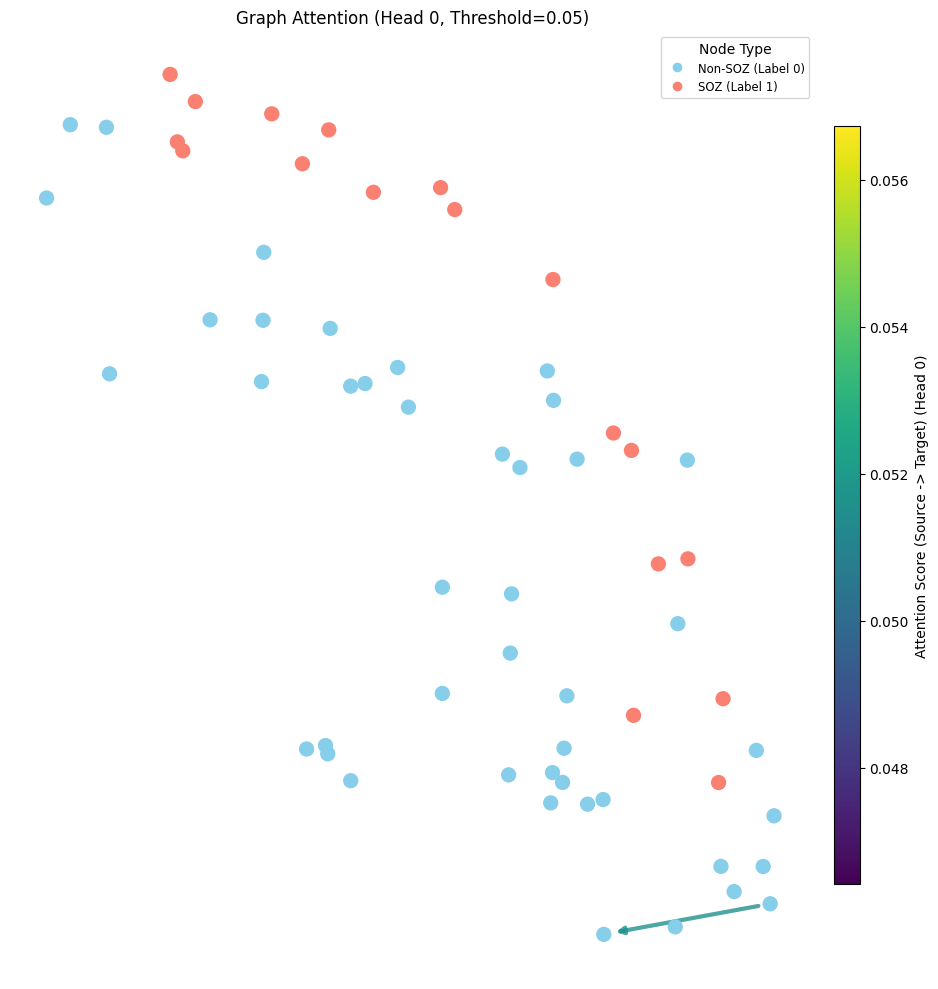

Data(x=[85, 508, 1], edge_index=[2, 7225], y=[85], pos=[85, 3], subject_id=[1])
torch.Size([1, 1, 6]) torch.Size([1, 1, 2]) torch.Size([1, 1, 508, 2])
Extracted attention weights shape: torch.Size([7225, 1])
Corresponding edge_index shape: torch.Size([2, 7225])


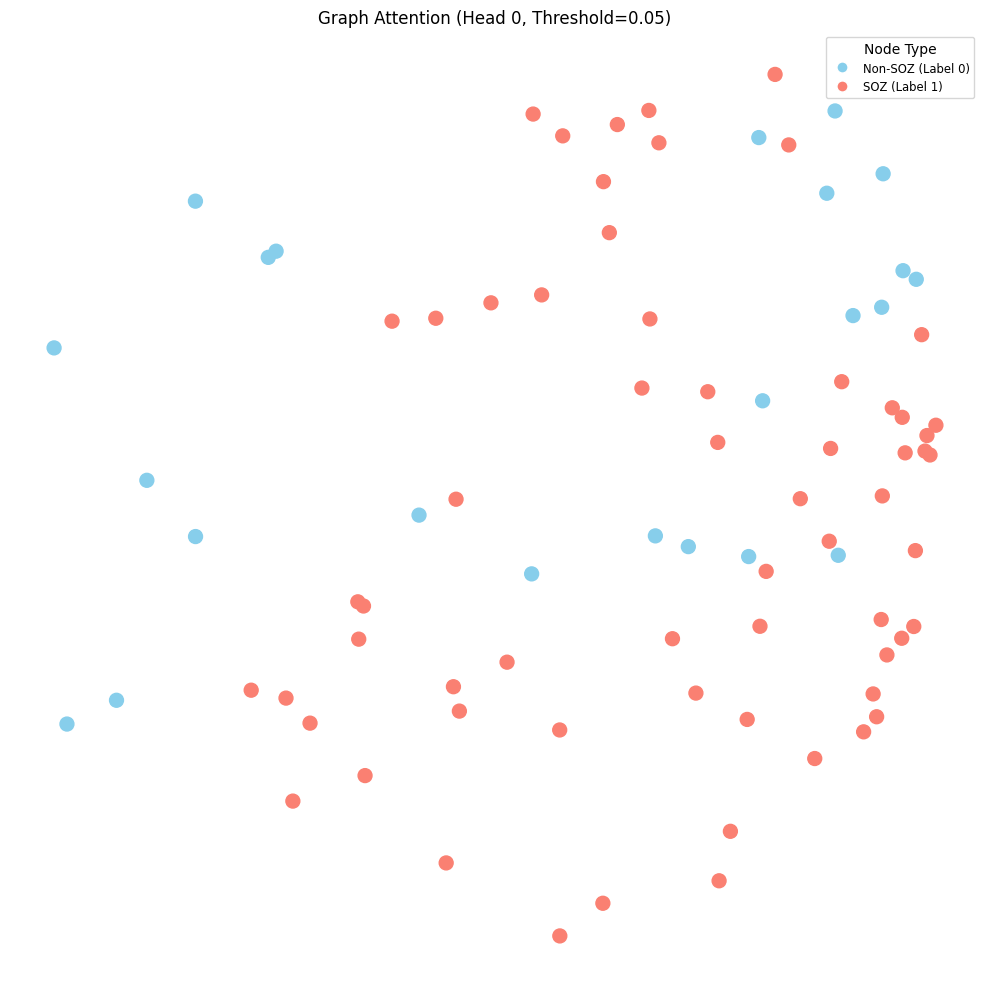

In [13]:
import networkx as nx

# --- Visualization Function ---
def plot_attention_weights(data, edge_index_att, attention_weights,
                           head_index=0, threshold=0.0,
                           figsize=(10, 10), dpi=100, # <-- Added parameters
                           ax=None, layout_func=nx.spring_layout, arrow_size=10):
    import networkx as nx
    from matplotlib.lines import Line2D # For custom legend

    # --- Node Position Handling ---
    pos_tensor = data.pos.cpu(); pos_dim = pos_tensor.shape[1]
    pos_dict = {i: pos_tensor[i,np.array([0,2])].numpy() for i in range(data.num_nodes)}

    # --- Node Color Handling (SOZ vs Non-SOZ) ---
    node_colors = 'gray'; legend_handles = None
    labels = data.y.cpu().numpy().astype(int)
    color_map = {0: 'skyblue', 1: 'salmon'}
    node_colors = [color_map.get(label, 'gray') for label in labels]
    unique_labels_in_graph = sorted(list(np.unique(labels)))
    legend_handles = []
    for label in unique_labels_in_graph:
        if label in color_map:
            desc = "SOZ" if label == 1 else "Non-SOZ"
            legend_handles.append(Line2D([0], [0], marker='o', color='w', label=f'{desc} (Label {label})',
                                        markerfacecolor=color_map[label], markersize=8))


    # --- Edge Handling ---
    att_weights_head = attention_weights[:, head_index].cpu().numpy()
    edge_index_np = edge_index_att.cpu().numpy()
    mask = att_weights_head >= threshold
    filtered_edge_index = edge_index_np[:, mask]
    filtered_weights = att_weights_head[mask]
    G = nx.DiGraph()
    G.add_nodes_from(range(data.num_nodes))
    has_edges_to_plot = filtered_weights.size > 0
    if has_edges_to_plot: 
        edges = list(zip(filtered_edge_index[0], filtered_edge_index[1]))
        G.add_edges_from(edges)
    else: 
        edges = []

    # --- Plotting ---
    created_fig = False
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
        created_fig = True

    # Draw nodes
    nx.draw_networkx_nodes(G, pos=pos_dict, ax=ax, node_size=100, node_color=node_colors)

    # Draw edges if any exist
    if has_edges_to_plot:
        min_w, max_w = filtered_weights.min(), filtered_weights.max()
        if max_w == min_w: norm_weights = np.ones_like(filtered_weights) * 0.5
        else: norm_weights = (filtered_weights - min_w) / (max_w - min_w)
        edge_colors = plt.cm.viridis(norm_weights)
        edge_widths = 1 + norm_weights * 4

        nx.draw_networkx_edges(
            G, pos=pos_dict, ax=ax, edgelist=edges, edge_color=edge_colors,
            width=edge_widths, alpha=0.8, arrows=True, arrowstyle='-|>',
            arrowsize=arrow_size
        )

        # Add edge colorbar
        sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=min_w, vmax=max_w))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, shrink=0.8, aspect=30, pad=0.02)
        cbar.set_label(f'Attention Score (Source -> Target) (Head {head_index})')

    # Add node legend
    if legend_handles:
        ax.legend(handles=legend_handles, title="Node Type", loc='best', fontsize='small')

    ax.set_title(f'Graph Attention (Head {head_index}, Threshold={threshold})')
    ax.axis('off')

    if created_fig:
        plt.tight_layout()
        plt.show()

sample_batch = next(iter(train_loader))

data_sample, c_sample, _, s_sample, u_sample = sample_batch
print(data_sample,c_sample.shape)
single_data_list = data_sample.to_data_list()

for i in range(len(single_data_list)):
    single_data = single_data_list[i]
    print(single_data)
    single_c = c_sample[0:1]
    single_s = s_sample[0:1]
    single_u = u_sample[0:1]
    print(single_c.shape,single_s.shape,single_u.shape)

    # 2. Use the new method to get attention weights
    edge_index_att, attention_weights = graph_clf.get_attention_weights(
        single_data, single_c, single_s, single_u
    )
    print(f"Extracted attention weights shape: {attention_weights.shape}")
    print(f"Corresponding edge_index shape: {edge_index_att.shape}")

    plot_attention_weights(
        data=single_data.to('cpu'),
        edge_index_att=edge_index_att,
        attention_weights=attention_weights,
        head_index=0, # Plot head 1
        threshold=0.05
    )



Batch Data object: DataBatch(x=[1003, 508, 1], edge_index=[2, 68125], y=[1003], pos=[1003, 3], subject_id=[16], batch=[1003], ptr=[17])
Condition shape: torch.Size([16, 1, 6])
Selected single graph data (Index 0): Data(x=[57, 508, 1], edge_index=[2, 3249], y=[57], pos=[57, 3], subject_id=[1])
Extracting related tensors for graph index 0 (nodes 0-56)
Extracted attention weights shape: torch.Size([3249, 1])
Corresponding edge_index shape: torch.Size([2, 3249])

--- Plotting Head 0 ---


C:\Users\tyler_p5hze3w\AppData\Local\Temp\ipykernel_30740\2295091066.py:58: UserWarning: 'adjacency_matrix' is not symmetric.
A directed graph will be plotted.
  view = plotting.plot_connectome(


Selected single graph data (Index 1): Data(x=[84, 508, 1], edge_index=[2, 7056], y=[84], pos=[84, 3], subject_id=[1])
Extracting related tensors for graph index 1 (nodes 57-140)
Extracted attention weights shape: torch.Size([7056, 1])
Corresponding edge_index shape: torch.Size([2, 7056])

--- Plotting Head 0 ---
Selected single graph data (Index 2): Data(x=[54, 508, 1], edge_index=[2, 2916], y=[54], pos=[54, 3], subject_id=[1])
Extracting related tensors for graph index 2 (nodes 141-194)
Extracted attention weights shape: torch.Size([2916, 1])
Corresponding edge_index shape: torch.Size([2, 2916])

--- Plotting Head 0 ---
Selected single graph data (Index 3): Data(x=[56, 508, 1], edge_index=[2, 3136], y=[56], pos=[56, 3], subject_id=[1])
Extracting related tensors for graph index 3 (nodes 195-250)
Extracted attention weights shape: torch.Size([3136, 1])
Corresponding edge_index shape: torch.Size([2, 3136])

--- Plotting Head 0 ---
Selected single graph data (Index 4): Data(x=[49, 508, 1

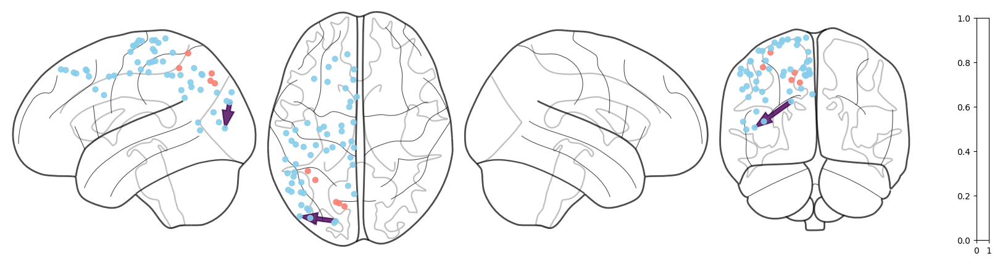

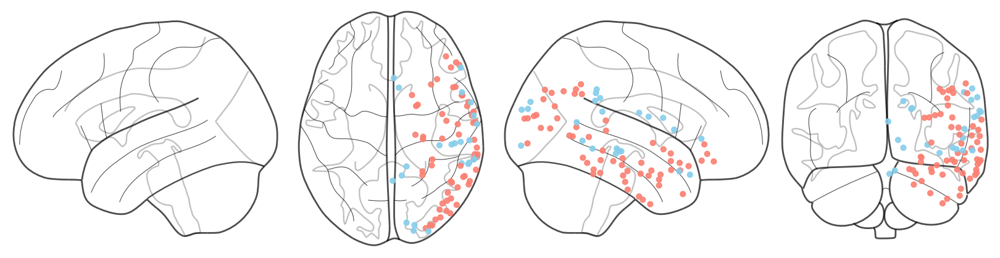

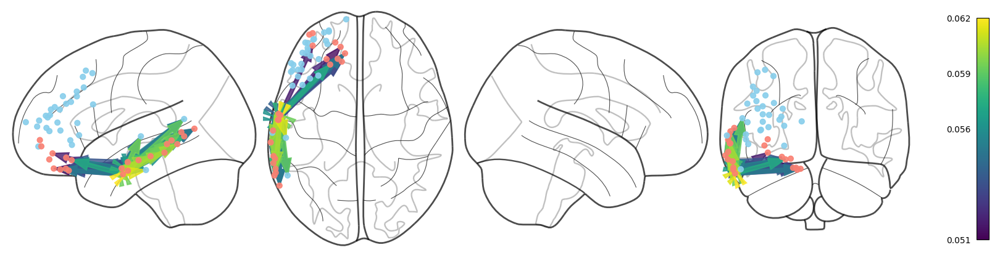

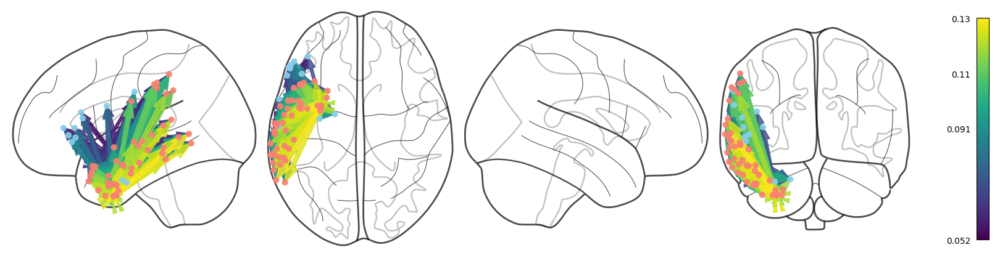

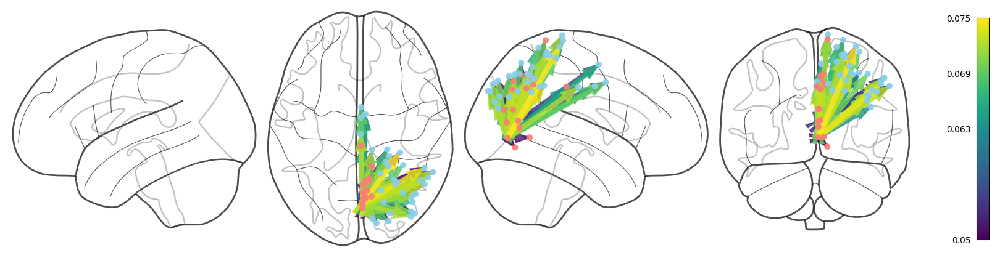

...

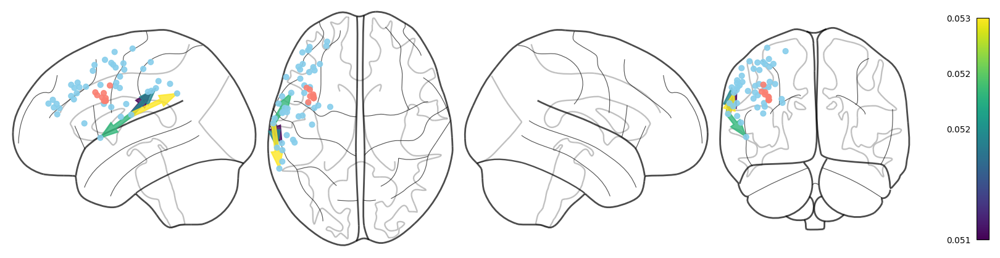

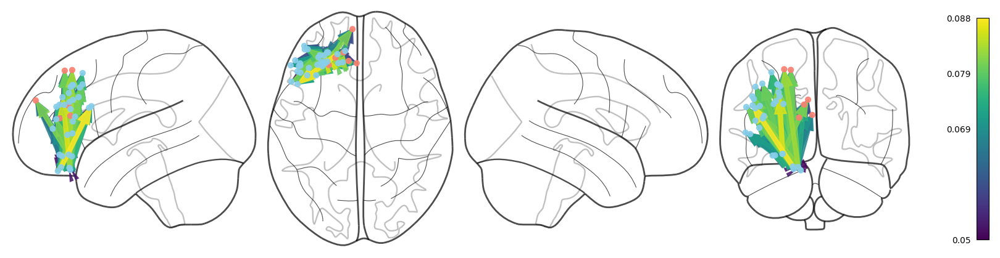

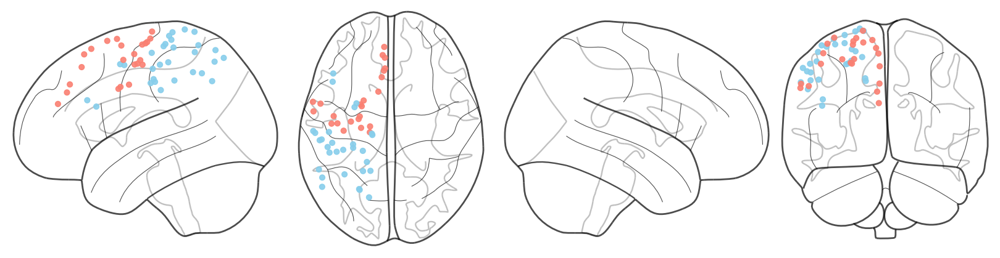

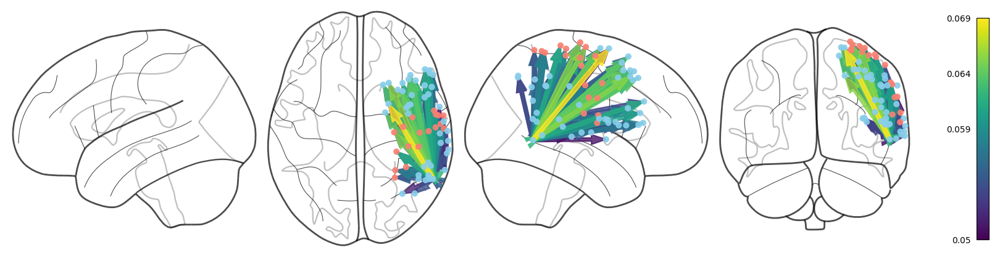

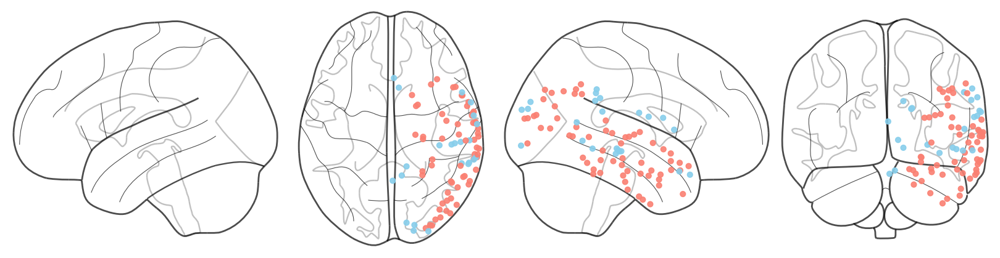

In [15]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np
import torch
from torch_geometric.data import Data
import networkx as nx
from nilearn import plotting

# --- Visualization Function for MNI Plot ---
def plot_attention_on_mni(data, edge_index_att, attention_weights,
                          head_index=0, threshold=0.0,
                          node_size=30, 
                          edge_cmap='viridis', 
                          display_mode='lzry',
                          figure=None):

    # --- Node Position Handling ---
    node_coords_tensor = data.pos.cpu()
    node_coords = node_coords_tensor.numpy()
    num_nodes = node_coords.shape[0]
    node_coords *= all_pos_data_std
    node_coords += all_pos_data_mean

    # --- Node Color Handling (SOZ vs Non-SOZ) ---
    node_colors_mapped = ['gray'] * num_nodes 
    color_map_node = {0: 'skyblue', 1: 'salmon'} 

    labels = data.y.cpu().numpy().astype(int)
    node_colors_mapped = [color_map_node.get(label, 'gray') for label in labels]

    # --- Edge Handling & Adjacency Matrix Creation ---
    att_weights_head = attention_weights[:, head_index].cpu().numpy()
    edge_index_np = edge_index_att.cpu().numpy()

    # Filter based on threshold
    mask = att_weights_head >= threshold
    filtered_edge_index = edge_index_np[:, mask]
    filtered_weights = att_weights_head[mask]

    # Create a sparse adjacency matrix for plot_connectome
    adjacency_matrix = np.zeros((num_nodes, num_nodes))
    has_edges_to_plot = filtered_weights.size > 0

    if has_edges_to_plot:
        sources = filtered_edge_index[0]
        targets = filtered_edge_index[1]
        adjacency_matrix[sources, targets] = filtered_weights
        edge_vmin = filtered_weights.min()
        edge_vmax = filtered_weights.max()
    else:
        edge_vmin = None
        edge_vmax = None

    if figure is None:
        figure = plt.figure(figsize=(16,4))

    # plot_connectome handles the figure creation if 'figure' is None
    view = plotting.plot_connectome(
        adjacency_matrix=adjacency_matrix,
        node_coords=node_coords,
        node_size=node_size,
        node_color=node_colors_mapped, # Use the list of colors based on 'y'
        edge_cmap=edge_cmap,
        edge_threshold=threshold + 1e-9 if has_edges_to_plot else None, # Show only edges > threshold (add epsilon)
        edge_vmin=edge_vmin, # Set color limits based on filtered weights
        edge_vmax=edge_vmax,
        colorbar=has_edges_to_plot, # Show colorbar only if edges are plotted
        edge_kwargs={'linewidth': 1.5, 'alpha': 0.8}, # Optional: Adjust edge line appearance
        node_kwargs={'alpha': 0.9}, # Optional: Adjust node appearance
        display_mode=display_mode,
        annotate=False, # Don't draw node numbers
        figure=figure
    )

    if figure is None: 
            plt.tight_layout(rect=[0, 0, 0.85, 0.95]) 

    # Show plot only if figure was not provided externally
    if figure is None:
        plt.show()

    return view

data_sample, c_sample, _, s_sample, u_sample = sample_batch
print(f"Batch Data object: {data_sample}")
print(f"Condition shape: {c_sample.shape}")

# Extract the first graph's data from the batch for visualization
single_data_list = data_sample.to_data_list()

for graph_index_to_plot in range(len(single_data_list)):

    single_data = single_data_list[graph_index_to_plot]
    print(f"Selected single graph data (Index {graph_index_to_plot}): {single_data}")

    # Ensure the selected graph has 3D positions
    if not hasattr(single_data, 'pos') or single_data.pos is None or single_data.pos.shape[1] != 3:
            print("Error: Selected graph data does not have 3D 'pos' attribute needed for MNI plotting.")
    else:
        start_node = sum(data_sample.to_data_list()[i].num_nodes for i in range(graph_index_to_plot))
        end_node = start_node + single_data.num_nodes
        print(f"Extracting related tensors for graph index {graph_index_to_plot} (nodes {start_node}-{end_node-1})")

        single_c = c_sample[graph_index_to_plot:graph_index_to_plot+1]
        single_s = s_sample[graph_index_to_plot:graph_index_to_plot+1]
        single_u = u_sample[graph_index_to_plot:graph_index_to_plot+1]

        # Use the model's method to get attention weights for the single graph
        edge_index_att, attention_weights = graph_clf.get_attention_weights(
                single_data, single_c, single_s, single_u
        )

        print(f"Extracted attention weights shape: {attention_weights.shape}") 
        print(f"Corresponding edge_index shape: {edge_index_att.shape}")

        # Plot the attention for specific heads on MNI template
        num_heads = attention_weights.shape[1]
        for head_idx in range(num_heads): #
            print(f"\n--- Plotting Head {head_idx} ---")
            plot_attention_on_mni(
                data=single_data.to('cpu'), 
                edge_index_att=edge_index_att,
                attention_weights=attention_weights,
                head_index=head_idx,
                threshold=0.05, 
                node_size=40,
                display_mode='lzry'
            )


In [17]:
import torch
import numpy as np
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score, f1_score, precision_score, recall_score, classification_report, balanced_accuracy_score, average_precision_score, confusion_matrix
from tqdm.auto import tqdm

@torch.no_grad()  # Decorator ensures no gradients are computed during evaluation
def evaluate_node_classifier(model, loader, device, positive_class_index=1):
    model.eval()  # Set model to evaluation mode
    model.to(device)

    all_labels_list = []
    all_preds_list = []
    all_probas_positive_list = [] 

    pbar = tqdm(loader, desc="Evaluating", leave=False)
    for data_batch, condition_batch, _, s_batch, u_batch in pbar:
        data_batch = data_batch.to(device)
        condition_batch = condition_batch.to(device)
        u_batch = u_batch.to(device)
        s_batch = s_batch.to(device)  
        labels = data_batch.y.to(device) 

        # --- Get Model Outputs ---
        logits = model(data_batch, condition_batch, s_batch, u_batch)  
        probas = F.softmax(logits, dim=1) 
        preds = torch.argmax(logits, dim=1) 
        all_labels_list.append(labels.cpu().numpy())
        all_preds_list.append(preds.cpu().numpy())
        all_probas_positive_list.append(probas[:, positive_class_index].cpu().numpy())

    # Concatenate results from all batches if any batches were processed
    if not all_labels_list:
        print("No labels collected during evaluation. Returning empty metrics.")
        return {}

    y_true = np.concatenate(all_labels_list)
    y_pred = np.concatenate(all_preds_list)
    y_pred_proba_positive = np.concatenate(all_probas_positive_list)

    # --- Calculate Metrics ---
    metrics = {}
    # Ensure there are samples from both classes for AUROC
    if len(np.unique(y_true)) > 1:
        metrics['AUROC'] = roc_auc_score(y_true, y_pred_proba_positive)
    else:
        metrics['AUROC'] = np.nan  # Not defined for single-class true labels
        print("AUROC not defined: Only one class present in true labels.")

    # Calculate AUPRC
    if len(np.unique(y_true)) > 1:
        metrics['AUPRC'] = average_precision_score(y_true, y_pred_proba_positive)
    else:
        metrics['AUPRC'] = np.nan  # Not defined for single-class true labels
        print("AUPRC not defined: Only one class present in true labels.")

    metrics['F1'] = f1_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
    metrics['Precision'] = precision_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
    metrics['Recall'] = recall_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)  # Sensitivity
    metrics['Balanced Accuracy'] = balanced_accuracy_score(y_true, y_pred)
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])  # Assuming binary classification with labels 0 and 1
    tn, fp, fn, tp = cm.ravel()  # Unpack confusion matrix
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    metrics['Specificity'] = specificity

    # Sensitivity is the same as Recall
    metrics['Sensitivity'] = metrics['Recall']  # Already computed

    # Calculate Youden's J Statistic
    youden_j = metrics['Sensitivity'] + metrics['Specificity'] - 1
    metrics['Youden_J'] = youden_j
    metrics['Classification Report'] = classification_report(y_true, y_pred, zero_division=0)
    metrics['Total Nodes Evaluated'] = len(y_true)

    return metrics

print("\n--- Evaluating final model on Validation Set ---")

# Use the appropriate model (node classifier if labels are per node)
final_val_metrics = evaluate_node_classifier(
    model=graph_clf,  # MAKE SURE this is the correct trained model variable
    loader=val_loader,
    device=DEVICE,
    positive_class_index=1  # Adjust if your positive class is 0
)

# --- Print the results ---
if final_val_metrics:
    print(f"Validation AUROC: {final_val_metrics.get('AUROC', 'N/A'):.4f}")
    print(f"Validation AUPRC: {final_val_metrics.get('AUPRC', 'N/A'):.4f}")
    print(f"Validation F1-Score: {final_val_metrics.get('F1', 'N/A'):.4f}")
    print(f"Validation Precision: {final_val_metrics.get('Precision', 'N/A'):.4f}")
    print(f"Validation Recall (Sensitivity): {final_val_metrics.get('Recall', 'N/A'):.4f}")
    print(f"Validation Specificity: {final_val_metrics.get('Specificity', 'N/A'):.4f}")
    print(f"Validation Youden's J: {final_val_metrics.get('Youden_J', 'N/A'):.4f}")
    print(f"Validation Balanced Accuracy: {final_val_metrics.get('Balanced Accuracy', 'N/A'):.4f}")
    print("\nValidation Classification Report:")
    print(final_val_metrics.get('Classification Report', 'N/A'))
else:
    print("Evaluation could not be performed.")


--- Evaluating final model on Validation Set ---


Evaluating:   0%|          | 0/238 [00:00<?, ?it/s]

Validation AUROC: 0.7429
Validation AUPRC: 0.4670
Validation F1-Score: 0.4535
Validation Precision: 0.4583
Validation Recall (Sensitivity): 0.4488
Validation Specificity: 0.8163
Validation Youden's J: 0.2651
Validation Balanced Accuracy: 0.6325

Validation Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.82      0.81    142154
           1       0.46      0.45      0.45     49221

    accuracy                           0.72    191375
   macro avg       0.63      0.63      0.63    191375
weighted avg       0.72      0.72      0.72    191375



In [18]:
import torch
import numpy as np
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score, f1_score, precision_score, recall_score, classification_report, balanced_accuracy_score, average_precision_score, confusion_matrix
from tqdm.auto import tqdm

@torch.no_grad()
def evaluate_node_classifier_detailed(model, loader, device, subject_id_map, positive_class_index=1):

    model.eval()
    model.to(device)

    all_labels_list = []
    all_preds_list = []
    all_probas_positive_list = []
    all_node_subject_ids_list = [] # <-- New list to store subject IDs per node

    pbar = tqdm(loader, desc="Evaluating (Detailed)", leave=False)
    for data_batch, condition_batch, _, s_batch, u_batch in pbar: # Adapt as needed!
        # --- Move data to device ---
        data_batch = data_batch.to(device)
        condition_batch = condition_batch.to(device)
        u_batch = u_batch.to(device)
        s_batch = s_batch.to(device)
        labels = data_batch.y.to(device)
        batch_vector = data_batch.batch
        subject_ids = data_batch.subject_id
        subject_node_ids = subject_ids[batch_vector]

        # --- Get Model Outputs ---
        logits = model(data_batch, condition_batch, s_batch, u_batch)
        probas = F.softmax(logits, dim=1)
        preds = torch.argmax(logits, dim=1)
        all_node_subject_ids_list.append(np.array(subject_node_ids.cpu().numpy()))
        all_labels_list.append(labels.cpu().numpy())
        all_preds_list.append(preds.cpu().numpy())
        all_probas_positive_list.append(probas[:, positive_class_index].cpu().numpy())

    y_true = np.concatenate(all_labels_list)
    y_pred = np.concatenate(all_preds_list)
    y_pred_proba_positive = np.concatenate(all_probas_positive_list)
    node_subject_ids = np.concatenate(all_node_subject_ids_list) # <-- Concatenate subject IDs

    # --- Calculate Overall Metrics (copied from original function) ---
    metrics = {}
    # ... (rest of the metric calculations: AUROC, AUPRC, F1, etc.) ...
    if len(np.unique(y_true)) > 1:
        metrics['AUROC'] = roc_auc_score(y_true, y_pred_proba_positive)
    else: metrics['AUROC'] = np.nan
    if len(np.unique(y_true)) > 1:
            metrics['AUPRC'] = average_precision_score(y_true, y_pred_proba_positive)
    else: metrics['AUPRC'] = np.nan
    metrics['F1'] = f1_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
    metrics['Precision'] = precision_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
    metrics['Recall'] = recall_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
    metrics['Balanced Accuracy'] = balanced_accuracy_score(y_true, y_pred)
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    metrics['Specificity'] = specificity
    metrics['Sensitivity'] = metrics['Recall']
    youden_j = metrics['Sensitivity'] + metrics['Specificity'] - 1
    metrics['Youden_J'] = youden_j
    metrics['Classification Report'] = classification_report(y_true, y_pred, zero_division=0)
    metrics['Total Nodes Evaluated'] = len(y_true)
    return {
        'metrics': metrics,
        'y_true': y_true,
        'y_pred': y_pred,
        'y_pred_proba_positive': y_pred_proba_positive, # <-- Return positive class probabilities
        'node_subject_ids': node_subject_ids # <-- Return the node subject IDs
    }

import numpy as np
from sklearn.metrics import accuracy_score
from collections import defaultdict

def calculate_regional_accuracy(y_true, y_pred, node_subject_ids, region_mapping):

    # Invert the region_mapping for easy lookup of regions per subject ID
    subject_to_region = region_mapping

    # Group predictions by region
    regional_data = defaultdict(lambda: {'true': [], 'pred': []})
    unique_regions = set(region_mapping.values())

    for i in range(len(y_true)):
        subject_id = node_subject_ids[i]
        region = subject_to_region.get(subject_id)

        regional_data[region]['true'].append(y_true[i])
        regional_data[region]['pred'].append(y_pred[i])


    # Calculate accuracy per region
    regional_accuracies = {}
    for region in unique_regions: #
        data = regional_data[region] 
        true_labels = np.array(data['true'])
        pred_labels = np.array(data['pred'])
        total_nodes = len(true_labels)

        if total_nodes > 0:
            acc = accuracy_score(true_labels, pred_labels)
            correct_preds = np.sum(true_labels == pred_labels)
        else:
            acc = np.nan # Accuracy is undefined for zero nodes
            correct_preds = 0

        regional_accuracies[region] = {
            'accuracy': acc,
            'correct_predictions': int(correct_preds),
            'total_nodes': total_nodes
        }

    return regional_accuracies

def calculate_regional_metrics(y_true, y_pred, y_pred_proba_positive, node_subject_ids, region_mapping, positive_class_index=1):

    required_len = len(y_true)

    subject_to_region = region_mapping
    regional_data = defaultdict(lambda: {'true': [], 'pred': [], 'proba_pos': []})
    unique_regions = sorted(list(set(region_mapping.values())))

    # Group data by region
    for i in range(required_len):
        subject_id = node_subject_ids[i]
        region = subject_to_region.get(subject_id)
        if region is not None:
            regional_data[region]['true'].append(y_true[i])
            regional_data[region]['pred'].append(y_pred[i])
            regional_data[region]['proba_pos'].append(y_pred_proba_positive[i])

    # Calculate metrics per region
    all_regional_metrics = {}
    for region in unique_regions:
        data = regional_data[region]
        region_y_true = np.array(data['true'])
        region_y_pred = np.array(data['pred'])
        region_y_proba = np.array(data['proba_pos'])
        total_nodes = len(region_y_true)

        metrics = {
            'Total Nodes': total_nodes,
            'Accuracy': np.nan,
            'AUROC': np.nan,
            'AUPRC': np.nan,
            'F1': np.nan,
            'Precision': np.nan,
            'Recall (Sensitivity)': np.nan,
            'Specificity': np.nan,
            'Balanced Accuracy': np.nan,
            'Youden_J': np.nan,
        }

        if total_nodes == 0:
            all_regional_metrics[region] = metrics # Keep NaNs if no nodes
            continue

        # --- Calculate Metrics ---
        metrics['Accuracy'] = accuracy_score(region_y_true, region_y_pred)
        metrics['Balanced Accuracy'] = balanced_accuracy_score(region_y_true, region_y_pred)

        # Metrics requiring probabilities and potentially multiple classes
        unique_true_labels = np.unique(region_y_true)
        if len(unique_true_labels) > 1: # Need both classes for AUROC/AUPRC
            try:
                metrics['AUROC'] = roc_auc_score(region_y_true, region_y_proba)
            except ValueError as e:
                print(f"Region '{region}': Could not calculate AUROC ({e})")
            try:
                metrics['AUPRC'] = average_precision_score(region_y_true, region_y_proba)
            except ValueError as e:
                 print(f"Region '{region}': Could not calculate AUPRC ({e})")
        else:
            print(f"Region '{region}': Only one class ({unique_true_labels}) present in true labels. AUROC/AUPRC not defined.")

        metrics['Precision'] = precision_score(region_y_true, region_y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
        metrics['Recall (Sensitivity)'] = recall_score(region_y_true, region_y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
        metrics['F1'] = f1_score(region_y_true, region_y_pred, pos_label=positive_class_index, average='binary', zero_division=0)

        try:
            cm = confusion_matrix(region_y_true, region_y_pred, labels=[0, 1])
            tn, fp, fn, tp = cm.ravel()
            if (tn + fp) > 0:
                metrics['Specificity'] = tn / (tn + fp)
            else:
                metrics['Specificity'] = 0.0 
            if not np.isnan(metrics['Recall (Sensitivity)']) and not np.isnan(metrics['Specificity']):
                 metrics['Youden_J'] = metrics['Recall (Sensitivity)'] + metrics['Specificity'] - 1

        except ValueError as e:
            print(f"Region '{region}': Could not calculate Confusion Matrix/Specificity ({e})")
        all_regional_metrics[region] = metrics

    return all_regional_metrics

print("\n--- Evaluating final model on Validation Set (Detailed) ---")
final_val_results = evaluate_node_classifier_detailed(
    model=graph_clf,
    loader=val_loader,
    device=DEVICE,
    subject_id_map=all_soz_labels,
    positive_class_index=1
)

# --- Calculate and Print Validation Regional Accuracy ---
print("\nCalculating Regional Accuracy for Validation Set...")
validation_regional_metrics = calculate_regional_metrics(
        final_val_results['y_true'],
        final_val_results['y_pred'],
        final_val_results['y_pred_proba_positive'], # Pass probabilities
        final_val_results['node_subject_ids'],
        all_soz_labels,
        positive_class_index=1
    )

print("Validation Set Regional Metrics:")
for region, metrics in validation_regional_metrics.items():
    if metrics['Total Nodes'] > 0:
        print(f"\nRegion: {region} (Nodes: {metrics['Total Nodes']})")
        print(f"  Accuracy:           {metrics['Accuracy']:.4f}")
        print(f"  AUROC:              {metrics['AUROC']:.4f}" if not np.isnan(metrics['AUROC']) else "  AUROC:              N/A")
        print(f"  AUPRC:              {metrics['AUPRC']:.4f}" if not np.isnan(metrics['AUPRC']) else "  AUPRC:              N/A")
        print(f"  F1-Score:           {metrics['F1']:.4f}")
        print(f"  Precision:          {metrics['Precision']:.4f}")
        print(f"  Recall (Sens.):     {metrics['Recall (Sensitivity)']:.4f}")
        print(f"  Specificity:        {metrics['Specificity']:.4f}" if not np.isnan(metrics['Specificity']) else "  Specificity:        N/A")
        print(f"  Balanced Accuracy:  {metrics['Balanced Accuracy']:.4f}")
        print(f"  Youden's J:         {metrics['Youden_J']:.4f}" if not np.isnan(metrics['Youden_J']) else "  Youden's J:         N/A")

print("\n--- Evaluating final model on Training Set (Detailed) ---")
final_train_results = evaluate_node_classifier_detailed(
    model=graph_clf,
    loader=train_loader,
    device=DEVICE,
    subject_id_map=all_soz_labels,
    positive_class_index=1
)

# --- Calculate and Print Validation Regional Accuracy ---
print("\nCalculating Regional Accuracy for Training Set...")
train_regional_metrics = calculate_regional_metrics(
        final_train_results['y_true'],
        final_train_results['y_pred'],
        final_train_results['y_pred_proba_positive'], # Pass probabilities
        final_train_results['node_subject_ids'],
        all_soz_labels,
        positive_class_index=1
    )

print("Training Set Regional Metrics:")
for region, metrics in train_regional_metrics.items():
    if metrics['Total Nodes'] > 0:
        print(f"\nRegion: {region} (Nodes: {metrics['Total Nodes']})")
        print(f"  Accuracy:           {metrics['Accuracy']:.4f}")
        print(f"  AUROC:              {metrics['AUROC']:.4f}" if not np.isnan(metrics['AUROC']) else "  AUROC:              N/A")
        print(f"  AUPRC:              {metrics['AUPRC']:.4f}" if not np.isnan(metrics['AUPRC']) else "  AUPRC:              N/A")
        print(f"  F1-Score:           {metrics['F1']:.4f}")
        print(f"  Precision:          {metrics['Precision']:.4f}")
        print(f"  Recall (Sens.):     {metrics['Recall (Sensitivity)']:.4f}")
        print(f"  Specificity:        {metrics['Specificity']:.4f}" if not np.isnan(metrics['Specificity']) else "  Specificity:        N/A")
        print(f"  Balanced Accuracy:  {metrics['Balanced Accuracy']:.4f}")
        print(f"  Youden's J:         {metrics['Youden_J']:.4f}" if not np.isnan(metrics['Youden_J']) else "  Youden's J:         N/A")



--- Evaluating final model on Validation Set (Detailed) ---


Evaluating (Detailed):   0%|          | 0/238 [00:00<?, ?it/s]


Calculating Regional Accuracy for Validation Set...
Validation Set Regional Metrics:

Region: Parietal (Nodes: 116252)
  Accuracy:           0.7352
  AUROC:              0.6960
  AUPRC:              0.3681
  F1-Score:           0.2654
  Precision:          0.3873
  Recall (Sens.):     0.2019
  Specificity:        0.9008
  Balanced Accuracy:  0.5513
  Youden's J:         0.1027

Region: Temporal (Nodes: 54995)
  Accuracy:           0.7200
  AUROC:              0.7965
  AUPRC:              0.5358
  F1-Score:           0.6137
  Precision:          0.5215
  Recall (Sens.):     0.7457
  Specificity:        0.7090
  Balanced Accuracy:  0.7274
  Youden's J:         0.4547

Region: Unknown/Subcortical (Nodes: 20114)
  Accuracy:           0.6491
  AUROC:              0.8054
  AUPRC:              0.6358
  F1-Score:           0.5494
  Precision:          0.4139
  Recall (Sens.):     0.8171
  Specificity:        0.5896
  Balanced Accuracy:  0.7034
  Youden's J:         0.4067

--- Evaluating fina

Evaluating (Detailed):   0%|          | 0/882 [00:00<?, ?it/s]


Calculating Regional Accuracy for Training Set...
Training Set Regional Metrics:

Region: Frontal (Nodes: 142391)
  Accuracy:           0.8122
  AUROC:              0.8968
  AUPRC:              0.8112
  F1-Score:           0.7168
  Precision:          0.7932
  Recall (Sens.):     0.6538
  Specificity:        0.9027
  Balanced Accuracy:  0.7782
  Youden's J:         0.5565

Region: Limbic/Cingulate (Nodes: 36440)
  Accuracy:           0.8195
  AUROC:              0.8080
  AUPRC:              0.6228
  F1-Score:           0.4160
  Precision:          0.8068
  Recall (Sens.):     0.2803
  Specificity:        0.9800
  Balanced Accuracy:  0.6301
  Youden's J:         0.2603

Region: Occipital (Nodes: 85165)
  Accuracy:           0.8585
  AUROC:              0.9359
  AUPRC:              0.8922
  F1-Score:           0.7932
  Precision:          0.8874
  Recall (Sens.):     0.7170
  Specificity:        0.9446
  Balanced Accuracy:  0.8308
  Youden's J:         0.6617

Region: Parietal (Nodes: 1

### K-FOLD

In [ ]:
def get_subject_data(all_data,subjects,y_out=True):

    X = all_data['ecog_x']
    Xstim = all_data['stim_x']
    Xpos = all_data['ecog_pos_x']
    if y_out:
        y = all_data['soz_y']
    c = all_data['condition_x']
    sids = all_data['subject']

    X_split = [] # training data
    Xstim_split = [] # training data
    Xpos_split = [] # training data 
    if y_out:
        y_split = [] # labels
    c_split = [] # conditions
    sids_split = [] # trial subject ids
    s_split = [] # subject info

    for subject in subjects:
        subject_trials = np.argwhere(sids == subject)[:,0]
        for iTrial in subject_trials:
            # append the data and labels
            X_split.append(X[iTrial][:,:,None])
            Xstim_split.append(Xstim[iTrial])
            Xpos_split.append(Xpos[iTrial])
            if y_out:
                y_split.append(y[iTrial])
            sids_split.append(subject)

            # stack conditions into one array
            c_trial = np.concatenate((
                c['stim_xyz'][iTrial][0],
                c['stim_xyz'][iTrial][1]
            ),axis=0)
            c_split.append(c_trial)

            # subject info
            s_trial = np.concatenate((
                np.array(c['age'][iTrial])[None],
                np.array(c['sex'][iTrial])[None]
            ),axis=0)
            s_split.append(s_trial)

    if y_out:
        return X_split,Xstim_split,Xpos_split,y_split,c_split,sids_split,s_split
    else:
        return X_split,Xstim_split,Xpos_split,c_split,sids_split,s_split

def all_zscore(data,data_mean=None,data_std=None):
    if data_mean is None or data_std is None:
        all_data = []
        for iTrial in range(len(data)):
            all_data.append(data[iTrial].reshape(-1))
        all_data = np.concatenate(all_data)
        data_mean = np.mean(all_data)
        data_std = np.std(all_data)

    data_z = []
    for iTrial in range(len(data)):
        data_z.append((data[iTrial] - data_mean)/data_std)
    return data_z,data_mean,data_std

def all_pos_zscore(data_pos,data_mean=None,data_std=None):
    if data_mean is None or data_std is None:
        all_data = []
        for iTrial in range(len(data_pos)):
            all_data.append(data_pos[iTrial])
        all_data = np.concatenate(all_data,axis=0)
        data_mean = np.mean(all_data)# ,axis=0)
        data_std = np.std(all_data)# ,axis=0)

    data_z = []
    for iTrial in range(len(data_pos)):
        data_z.append((data_pos[iTrial] - data_mean)/data_std)
    return data_z,data_mean,data_std

def all_cond_zscore(data_pos,data_mean=None,data_std=None):
    if data_mean is None or data_std is None:
        all_data = []
        for iTrial in range(len(data_pos)):
            all_data.append(data_pos[iTrial])
        all_data = np.array(all_data)
        data_mean = np.mean(all_data)# ,axis=0)
        data_std = np.std(all_data)# ,axis=0)

    data_z = []
    for iTrial in range(len(data_pos)):
        data_z.append((data_pos[iTrial] - data_mean)/data_std)
    return data_z,data_mean,data_std

import torch
from torch_geometric.data import Data, Batch
from torch_geometric.loader import DataLoader
from torch_geometric.utils import dense_to_sparse, add_self_loops, to_dense_batch, scatter
import torch
import numpy as np
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score, f1_score, precision_score, recall_score, classification_report, balanced_accuracy_score, average_precision_score, confusion_matrix
from tqdm.auto import tqdm
# --- Helper Function to Create Fully Connected Graph ---
def create_fully_connected_edge_index(num_nodes, self_loops=False, device=None):
    adj = torch.ones((num_nodes, num_nodes), dtype=torch.uint8, device=device)
    if not self_loops:
        adj.fill_diagonal_(0)
    edge_index, _ = dense_to_sparse(adj)
    return edge_index

def create_graph_spatial_cond_data(X,Xpos,c,subject_ids,s,u,y):
    num_nodes, _, _ = X.shape
    X_tensor = torch.tensor(X,dtype=torch.float32)
    Xpos_tensor = torch.tensor(Xpos,dtype=torch.float32)
    edge_index = create_fully_connected_edge_index(num_nodes,self_loops=True)
    y_node_labels_tensor = torch.tensor(y, dtype=torch.long)
    subject_ids_tensor = torch.tensor(subject_ids,dtype=torch.float32).unsqueeze(0)
    data = Data(x=X_tensor,
                edge_index=edge_index,
                pos=Xpos_tensor,
                subject_id=subject_ids_tensor,
                y=y_node_labels_tensor)
    c_tensor = torch.tensor(c,dtype=torch.float32).unsqueeze(0)
    s_tensor = torch.tensor(s,dtype=torch.float32).unsqueeze(0)
    u_tensor = torch.tensor(u,dtype=torch.float32).unsqueeze(0)
    return data,c_tensor,s_tensor,u_tensor

# --- DataLoader with Custom Collate ---
class CustomGraphCondDataset(torch.utils.data.Dataset):
    def __init__(self, data_cond_list):
        self.data_list = [item[0] for item in data_cond_list]
        self.condition_list = [item[1] for item in data_cond_list]
        self.subject_list = [item[2] for item in data_cond_list]
        self.input_list = [item[3] for item in data_cond_list]
    def __len__(self): 
        return len(self.data_list)
    def __getitem__(self, idx): 
        # Return data, condition, and subject_id
        x_idx = self.data_list[idx]
        c_idx = self.condition_list[idx]
        sid_idx = self.data_list[idx].subject_id
        s_idx = self.subject_list[idx]
        u_idx = self.input_list[idx]
        #y_idx = self.data_list[idx].y
        return x_idx, c_idx, sid_idx, s_idx, u_idx#, y_idx

def collate_fn(batch):
    data_items = [item[0] for item in batch]
    condition_items = [item[1] for item in batch]
    subject_id_items = [item[2] for item in batch] # Collect subject IDs
    s_items = [item[3] for item in batch] # Collect subject IDs
    u_items = [item[4] for item in batch] # Collect subject IDs
    # y_items = [item[5][:,None] for item in batch] # Collect subject IDs
    data_batch = Batch.from_data_list(data_items)
    condition_batch = torch.cat(condition_items,dim=0)
    s_batch = torch.cat(s_items,dim=0)
    u_batch = torch.cat(u_items,dim=0)
    # y_batch = Batch.from_data_list(y_items) #torch.cat(y_items,dim=0)
    return data_batch, condition_batch, subject_id_items, s_batch, u_batch # , y_batch

def create_dataset(X,Xpos,c,subject_ids,s,u,y,batch_size=64):
    # --- Create Dataset ---
    dataset = [
        create_graph_spatial_cond_data(X[iTrial],Xpos[iTrial],c[iTrial],subject_ids[iTrial],s[iTrial],u[iTrial],y[iTrial]) for iTrial in range(len(X))
    ]
    custom_dataset = CustomGraphCondDataset(dataset)
    loader = DataLoader(custom_dataset,batch_size=batch_size,shuffle=True,collate_fn=collate_fn,drop_last=True)
    return loader

@torch.no_grad() 
def evaluate_node_classifier(model, loader, device, positive_class_index=1):
    model.eval() 
    model.to(device)

    all_labels_list = []
    all_preds_list = []
    all_probas_positive_list = []  #

    pbar = tqdm(loader, desc="Evaluating", leave=False)
    for data_batch, condition_batch, _, s_batch, u_batch in pbar:
        # --- Move data to device ---
        data_batch = data_batch.to(device)
        condition_batch = condition_batch.to(device)
        u_batch = u_batch.to(device)
        s_batch = s_batch.to(device) 
        labels = data_batch.y.to(device)

        # Simple check - consider adding more robust checks if needed
        if not hasattr(data_batch, 'num_nodes') or labels.shape[0] != data_batch.num_nodes:
            print(f"Warning: Label shape {labels.shape} mismatch with node count {getattr(data_batch, 'num_nodes', 'N/A')}. Skipping batch.")
            continue

        # --- Get Model Outputs ---
        logits = model(data_batch, condition_batch, s_batch, u_batch) 
        probas = F.softmax(logits, dim=1) 
        preds = torch.argmax(logits, dim=1)
        all_labels_list.append(labels.cpu().numpy())
        all_preds_list.append(preds.cpu().numpy())
        all_probas_positive_list.append(probas[:, positive_class_index].cpu().numpy())

    if not all_labels_list:
        print("No labels collected during evaluation. Returning empty metrics.")
        return {}

    y_true = np.concatenate(all_labels_list)
    y_pred = np.concatenate(all_preds_list)
    y_pred_proba_positive = np.concatenate(all_probas_positive_list)

    # --- Calculate Metrics ---
    metrics = {}
    try:
        # Ensure there are samples from both classes for AUROC
        if len(np.unique(y_true)) > 1:
            metrics['AUROC'] = roc_auc_score(y_true, y_pred_proba_positive)
        else:
            metrics['AUROC'] = np.nan  # Not defined for single-class true labels
            print("AUROC not defined: Only one class present in true labels.")
    except ValueError as e:
        print(f"Could not calculate AUROC: {e}")
        metrics['AUROC'] = np.nan

    # Calculate AUPRC
    try:
        if len(np.unique(y_true)) > 1:
            metrics['AUPRC'] = average_precision_score(y_true, y_pred_proba_positive)
        else:
            metrics['AUPRC'] = np.nan  # Not defined for single-class true labels
            print("AUPRC not defined: Only one class present in true labels.")
    except ValueError as e:
        print(f"Could not calculate AUPRC: {e}")
        metrics['AUPRC'] = np.nan

    metrics['F1'] = f1_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
    metrics['Precision'] = precision_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)
    metrics['Recall'] = recall_score(y_true, y_pred, pos_label=positive_class_index, average='binary', zero_division=0)  # Sensitivity
    metrics['Balanced Accuracy'] = balanced_accuracy_score(y_true, y_pred)

    try:
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1]) 
        tn, fp, fn, tp = cm.ravel()  # Unpack confusion matrix
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        metrics['Specificity'] = specificity
    except ValueError as e:
        print(f"Could not calculate Specificity: {e}")
        metrics['Specificity'] = np.nan
    metrics['Sensitivity'] = metrics['Recall']  # Already computed

    # Calculate Youden's J Statistic
    try:
        youden_j = metrics['Sensitivity'] + metrics['Specificity'] - 1
        metrics['Youden_J'] = youden_j
    except TypeError as e:
        print(f"Could not calculate Youden's J: {e}")
        metrics['Youden_J'] = np.nan

    try:
        metrics['Classification Report'] = classification_report(y_true, y_pred, zero_division=0)
    except ValueError as e:
        metrics['Classification Report'] = f"Could not generate report: {e}"

    metrics['Total Nodes Evaluated'] = len(y_true)

    return metrics

In [ ]:
# --- Model Hyperparameters ---
COORD_EMBED_DIM = 8 # #8 # 8 # 8
GNN_HIDDEN = 64 # 64
GAT_HEADS = 4 # 4
TEMPORAL_HIDDEN = 32  # // 2
NUM_LSTM_LAYERS = 7 #6
KERNEL_SIZE = 3 # 0# 3
EPOCHS = 10 # 

# --- 5-Fold Cross-Validation Setup ---
soz_unique_subjects = np.unique(all_run_data_soz['subject'])

n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True,random_state=42)
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42) # Use shuffle & random_state for reproducibility

fold_results = [] # Store performance metrics for each fold
BATCH_SIZE = 16
# --- Cross-Validation Loop ---
for i_fold, (soz_train_indices, soz_test_indices) in enumerate(kf.split(soz_unique_subjects)):

    print(f"\n===== Fold {i_fold + 1}/{n_splits} =====")

    # 1. Identify subjects for this fold
    soz_train_subjects_fold = soz_unique_subjects[soz_train_indices]
    soz_test_subjects_fold = soz_unique_subjects[soz_test_indices]
    print(soz_train_subjects_fold,soz_test_subjects_fold)

    print(f"SOZ Train Subjects: {len(np.unique(soz_train_subjects_fold))}")
    print(f"SOZ Test Subjects: {len(np.unique(soz_test_subjects_fold))}")

    #  Get data for this fold using get_subject_data
    X_train_l, Xstim_train_l, Xpos_train_l, y_train_l, c_train_l, sids_train_l, s_train_l = \
        get_subject_data(all_run_data_soz, soz_train_subjects_fold, y_out=True)
    X_test, Xstim_test, Xpos_test, y_test, c_test, sids_test, s_test = \
        get_subject_data(all_run_data_soz, soz_test_subjects_fold, y_out=True)

    print(f"Trials - SOZ Train: {len(X_train_l)}, SOZ Test: {len(X_test)}")

    X_train = X_train_l
    Xstim_train = Xstim_train_l
    Xpos_train = Xpos_train_l
    sids_train = sids_train_l
    y_train = y_train_l
    c_train = c_train_l
    s_train = s_train_l

    # Perform Normalization
    print("Normalizing data for Fold...")
    X_train = all_zscore_trial(X_train)
    X_test = all_zscore_trial(X_test)

    # Normalize Stimulus data (based on SOZ training data for this fold)
    Xstim_train, Xstim_train_mean, Xstim_train_std = all_zscore(Xstim_train)
    Xstim_test, _, _ = all_zscore(Xstim_test, Xstim_train_mean, Xstim_train_std)

    # Normalize Position/Condition data
    all_pos_data_fold = []
    for iTrial in range(len(Xpos_train)):
        c_pos_tiled = np.tile(c_train[iTrial][None,:], (Xpos_train[iTrial].shape[0], 1))
        pos_data = np.concatenate([Xpos_train[iTrial], c_pos_tiled], axis=1)
        all_pos_data_fold.append(pos_data)
    all_pos_data_concat = np.concatenate(all_pos_data_fold, axis=0)
    all_pos_data_mean_fold = np.mean(all_pos_data_concat)
    all_pos_data_std_fold = np.std(all_pos_data_concat)

    # Apply normalization using fold-specific stats
    Xpos_train, _, _ = all_pos_zscore(Xpos_train, all_pos_data_mean_fold, all_pos_data_std_fold)
    Xpos_test, _, _ = all_pos_zscore(Xpos_test, all_pos_data_mean_fold, all_pos_data_std_fold)
    c_train, _, _ = all_cond_zscore(c_train, all_pos_data_mean_fold, all_pos_data_std_fold)
    c_test, _, _ = all_cond_zscore(c_test, all_pos_data_mean_fold, all_pos_data_std_fold)

    # set params
    _,NUM_TIMESTEPS,NODE_FEAT_DIM = X_train[0].shape
    _,COORD_DIM = Xpos_train[0].shape
    COND_DIM = c_train[0].shape[0]
    train_loader = create_dataset(X_train,Xpos_train,c_train,sids_train,s_train,Xstim_train,y_train,batch_size=BATCH_SIZE)
    test_loader = create_dataset(X_test,Xpos_test,c_test,sids_test,s_test,Xstim_test,y_test,batch_size=BATCH_SIZE)

    # Calculate class weights
    from tqdm.auto import tqdm
    print("Calculating class weights...")
    label_counts = {}
    total_nodes = 0
    # Iterate through loader once to get all node labels
    for data_batch, _, _, _, _ in tqdm(train_loader, desc="Counting Labels"):
        labels = data_batch.y.numpy() # Get node labels for the batch
        for label in labels:
            label_counts[label] = label_counts.get(label, 0) + 1
        total_nodes += len(labels)
    num_classes = len(label_counts)
    weights = []
    print(f"Label Counts: {label_counts}, Total Nodes: {total_nodes}")
    # Ensure weights are ordered correctly by class index (0, 1, ...)
    for i in range(num_classes):
        count = label_counts.get(i, 1) # Use 1 if class is missing to avoid division by zero
        weight = total_nodes / (num_classes * count)
        weights.append(weight)
    class_weights = torch.tensor(weights, dtype=torch.float32)
    print(f"Calculated Class Weights: {class_weights}")

    # Model Training
    print("Training model...")
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {DEVICE}")
    graph_clf = GraphNodeClassifier(
        num_classes=2,node_feature_dim=NODE_FEAT_DIM,
        s_dim=2,u_dim=2,coord_dim=COORD_DIM,coord_embed_dim=COORD_EMBED_DIM,
        temporal_hidden_dim=TEMPORAL_HIDDEN, gnn_hidden_dim=GNN_HIDDEN,
        num_temporal_layers=NUM_LSTM_LAYERS,gat_heads=GAT_HEADS,
        dropout_rate=0.4,device=DEVICE,
        tau=2,M=30,kernel_size=KERNEL_SIZE
    )
    graph_clf.fit(
        train_loader=train_loader,val_loader=None,
        epochs=EPOCHS,learning_rate=5e-4,weight_decay=1e-3,step_size=0,
        device=DEVICE,optimizer_class=optim.Adam,class_weights=class_weights
    )
    print("\n--- Training finished ---")

    # Model Evaluation 
    print("Evaluating model...")
    detailed_test_results = evaluate_node_classifier_detailed(
        model=graph_clf,        # Model trained for this fold
        loader=test_loader,     # Test loader specific to this fold
        device=DEVICE,
        subject_id_map=all_soz_labels, # Adjust if needed based on your function's design
        positive_class_index=1  # Adjust if your positive class is 0
    )
    current_fold_data = {'fold': i_fold + 1}
    current_fold_data['overall_metrics'] = detailed_test_results.get('metrics', {})

    # Calculate the metrics for each region
    print(f"Calculating Regional Metrics for Fold {i_fold + 1} Test Set...")
    regional_metrics_for_fold = calculate_regional_metrics(
        detailed_test_results['y_true'],
        detailed_test_results['y_pred'],
        detailed_test_results['y_pred_proba_positive'],
        detailed_test_results['node_subject_ids'],
        all_soz_labels, # Pass your subject_id -> region mapping
        positive_class_index=1
    )
    filtered_regional_metrics = {}
    for region, metrics_dict in regional_metrics_for_fold.items():
        if metrics_dict.get('Total Nodes', 0) > 0:
            filtered_regional_metrics[region] = metrics_dict

    current_fold_data['regional_metrics'] = filtered_regional_metrics
    fold_results.append(current_fold_data)
    print(f"Test AUROC: {current_fold_data['overall_metrics'].get('AUROC', 'N/A'):.4f}")
    print(f"Test AUPRC: {current_fold_data['overall_metrics'].get('AUPRC', 'N/A'):.4f}")
    print(f"Test F1-Score: {current_fold_data['overall_metrics'].get('F1', 'N/A'):.4f}")
    print(f"Test Precision: {current_fold_data['overall_metrics'].get('Precision', 'N/A'):.4f}")
    print(f"Test Recall (Sensitivity): {current_fold_data['overall_metrics'].get('Recall', 'N/A'):.4f}")
    print(f"Test Specificity: {current_fold_data['overall_metrics'].get('Specificity', 'N/A'):.4f}")
    print(f"Test Youden's J: {current_fold_data['overall_metrics'].get('Youden_J', 'N/A'):.4f}")
    print(f"Test Balanced Accuracy: {current_fold_data['overall_metrics'].get('Balanced Accuracy', 'N/A'):.4f}")
    print("\Test Classification Report:")
    print(current_fold_data['overall_metrics'].get('Classification Report', 'N/A'))



===== Fold 1/5 =====
[ 7 15 17 21 26 28 29 31 33 35 36 37 40 41 44 45 46 47 49 51 52 53 57 58
 59 62 63 65] [38 39 42 48 55 60 61 69]
SOZ Train Subjects: 28
SOZ Test Subjects: 8
Trials - SOZ Train: 16874, SOZ Test: 4900
Normalizing data for Fold...
Calculating class weights...


Counting Labels:   0%|          | 0/1054 [00:00<?, ?it/s]

Label Counts: {0: 617437, 1: 364067}, Total Nodes: 981504
Calculated Class Weights: tensor([0.7948, 1.3480])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 1/10 | Train Loss: 0.6694, Train AUROC: 0.6390, Train AUPRC: 0.4958


Epoch 2/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 2/10 | Train Loss: 0.6289, Train AUROC: 0.7023, Train AUPRC: 0.5796


Epoch 3/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 3/10 | Train Loss: 0.6134, Train AUROC: 0.7227, Train AUPRC: 0.6033


Epoch 4/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 4/10 | Train Loss: 0.5999, Train AUROC: 0.7387, Train AUPRC: 0.6246


Epoch 5/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 5/10 | Train Loss: 0.5877, Train AUROC: 0.7522, Train AUPRC: 0.6433


Epoch 6/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 6/10 | Train Loss: 0.5781, Train AUROC: 0.7628, Train AUPRC: 0.6580


Epoch 7/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 7/10 | Train Loss: 0.5700, Train AUROC: 0.7716, Train AUPRC: 0.6712


Epoch 8/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 8/10 | Train Loss: 0.5642, Train AUROC: 0.7777, Train AUPRC: 0.6793


Epoch 9/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 9/10 | Train Loss: 0.5581, Train AUROC: 0.7834, Train AUPRC: 0.6866


Epoch 10/10 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 10/10 | Train Loss: 0.5525, Train AUROC: 0.7886, Train AUPRC: 0.6925

--- Training finished (No validation/early stopping or no improvement found) ---

--- Training finished ---
Evaluating model...


Evaluating (Detailed):   0%|          | 0/306 [00:00<?, ?it/s]

Calculating Regional Metrics for Fold 1 Test Set...
Test AUROC: 0.5737
Test AUPRC: 0.4651
Test F1-Score: 0.4698
Test Precision: 0.4893
Test Recall (Sensitivity): 0.4519
Test Specificity: 0.6475
Test Youden's J: 0.0993
Test Balanced Accuracy: 0.5497
\Test Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.65      0.63    187225
           1       0.49      0.45      0.47    139954

    accuracy                           0.56    327179
   macro avg       0.55      0.55      0.55    327179
weighted avg       0.56      0.56      0.56    327179


===== Fold 2/5 =====
[15 17 21 28 29 31 36 37 38 39 40 41 42 45 46 47 48 49 51 52 53 55 57 58
 60 61 62 63 69] [ 7 26 33 35 44 59 65]
SOZ Train Subjects: 29
SOZ Test Subjects: 7
Trials - SOZ Train: 17246, SOZ Test: 4528
Normalizing data for Fold...
Calculating class weights...


Counting Labels:   0%|          | 0/1077 [00:00<?, ?it/s]

Label Counts: {0: 644044, 1: 370283}, Total Nodes: 1014327
Calculated Class Weights: tensor([0.7875, 1.3697])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 1/10 | Train Loss: 0.6990, Train AUROC: 0.5961, Train AUPRC: 0.4436


Epoch 2/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 2/10 | Train Loss: 0.6526, Train AUROC: 0.6646, Train AUPRC: 0.5260


Epoch 3/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 3/10 | Train Loss: 0.6328, Train AUROC: 0.6962, Train AUPRC: 0.5645


Epoch 4/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 4/10 | Train Loss: 0.6151, Train AUROC: 0.7206, Train AUPRC: 0.5931


Epoch 5/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 5/10 | Train Loss: 0.6026, Train AUROC: 0.7359, Train AUPRC: 0.6125


Epoch 6/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 6/10 | Train Loss: 0.5928, Train AUROC: 0.7469, Train AUPRC: 0.6287


Epoch 7/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 7/10 | Train Loss: 0.5887, Train AUROC: 0.7521, Train AUPRC: 0.6352


Epoch 8/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 8/10 | Train Loss: 0.5826, Train AUROC: 0.7592, Train AUPRC: 0.6446


Epoch 9/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 9/10 | Train Loss: 0.5761, Train AUROC: 0.7667, Train AUPRC: 0.6553


Epoch 10/10 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 10/10 | Train Loss: 0.5682, Train AUROC: 0.7751, Train AUPRC: 0.6660

--- Training finished (No validation/early stopping or no improvement found) ---

--- Training finished ---
Evaluating model...


Evaluating (Detailed):   0%|          | 0/283 [00:00<?, ?it/s]

Calculating Regional Metrics for Fold 2 Test Set...
Test AUROC: 0.6361
Test AUPRC: 0.5545
Test F1-Score: 0.5832
Test Precision: 0.6478
Test Recall (Sensitivity): 0.5303
Test Specificity: 0.7601
Test Youden's J: 0.2905
Test Balanced Accuracy: 0.6452
\Test Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.76      0.71    160657
           1       0.65      0.53      0.58    133630

    accuracy                           0.66    294287
   macro avg       0.65      0.65      0.65    294287
weighted avg       0.65      0.66      0.65    294287


===== Fold 3/5 =====
[ 7 21 26 29 31 33 35 36 38 39 40 42 44 45 47 48 49 51 53 55 57 58 59 60
 61 62 63 65 69] [15 17 28 37 41 46 52]
SOZ Train Subjects: 29
SOZ Test Subjects: 7
Trials - SOZ Train: 17076, SOZ Test: 4698
Normalizing data for Fold...
Calculating class weights...


Counting Labels:   0%|          | 0/1067 [00:00<?, ?it/s]

Label Counts: {0: 640106, 1: 419547}, Total Nodes: 1059653
Calculated Class Weights: tensor([0.8277, 1.2629])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 1/10 | Train Loss: 0.6834, Train AUROC: 0.6344, Train AUPRC: 0.5120


Epoch 2/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 2/10 | Train Loss: 0.6291, Train AUROC: 0.7063, Train AUPRC: 0.5984


Epoch 3/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 3/10 | Train Loss: 0.6106, Train AUROC: 0.7308, Train AUPRC: 0.6275


Epoch 4/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 4/10 | Train Loss: 0.5922, Train AUROC: 0.7525, Train AUPRC: 0.6563


Epoch 5/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 5/10 | Train Loss: 0.5706, Train AUROC: 0.7747, Train AUPRC: 0.6893


Epoch 6/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 6/10 | Train Loss: 0.5514, Train AUROC: 0.7937, Train AUPRC: 0.7140


Epoch 7/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 7/10 | Train Loss: 0.5366, Train AUROC: 0.8073, Train AUPRC: 0.7309


Epoch 8/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 8/10 | Train Loss: 0.5262, Train AUROC: 0.8159, Train AUPRC: 0.7423


Epoch 9/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 9/10 | Train Loss: 0.5188, Train AUROC: 0.8219, Train AUPRC: 0.7508


Epoch 10/10 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 10/10 | Train Loss: 0.5113, Train AUROC: 0.8277, Train AUPRC: 0.7591

--- Training finished (No validation/early stopping or no improvement found) ---

--- Training finished ---
Evaluating model...


Evaluating (Detailed):   0%|          | 0/293 [00:00<?, ?it/s]

Calculating Regional Metrics for Fold 3 Test Set...
Test AUROC: 0.5257
Test AUPRC: 0.3708
Test F1-Score: 0.3245
Test Precision: 0.3995
Test Recall (Sensitivity): 0.2732
Test Specificity: 0.7892
Test Youden's J: 0.0624
Test Balanced Accuracy: 0.5312
\Test Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.79      0.73    164608
           1       0.40      0.27      0.32     84475

    accuracy                           0.61    249083
   macro avg       0.54      0.53      0.53    249083
weighted avg       0.58      0.61      0.59    249083


===== Fold 4/5 =====
[ 7 15 17 26 28 29 31 33 35 37 38 39 40 41 42 44 45 46 47 48 52 53 55 58
 59 60 61 65 69] [21 36 49 51 57 62 63]
SOZ Train Subjects: 29
SOZ Test Subjects: 7
Trials - SOZ Train: 17954, SOZ Test: 3820
Normalizing data for Fold...
Calculating class weights...


Counting Labels:   0%|          | 0/1122 [00:00<?, ?it/s]

Label Counts: {1: 454894, 0: 662499}, Total Nodes: 1117393
Calculated Class Weights: tensor([0.8433, 1.2282])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 1/10 | Train Loss: 0.6912, Train AUROC: 0.5945, Train AUPRC: 0.4846


Epoch 2/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 2/10 | Train Loss: 0.6468, Train AUROC: 0.6750, Train AUPRC: 0.5783


Epoch 3/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 3/10 | Train Loss: 0.6238, Train AUROC: 0.7099, Train AUPRC: 0.6157


Epoch 4/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 4/10 | Train Loss: 0.6074, Train AUROC: 0.7318, Train AUPRC: 0.6413


Epoch 5/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 5/10 | Train Loss: 0.5902, Train AUROC: 0.7521, Train AUPRC: 0.6670


Epoch 6/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 6/10 | Train Loss: 0.5719, Train AUROC: 0.7714, Train AUPRC: 0.6896


Epoch 7/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 7/10 | Train Loss: 0.5602, Train AUROC: 0.7827, Train AUPRC: 0.7026


Epoch 8/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 8/10 | Train Loss: 0.5516, Train AUROC: 0.7906, Train AUPRC: 0.7121


Epoch 9/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 9/10 | Train Loss: 0.5440, Train AUROC: 0.7981, Train AUPRC: 0.7214


Epoch 10/10 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 10/10 | Train Loss: 0.5375, Train AUROC: 0.8044, Train AUPRC: 0.7294

--- Training finished (No validation/early stopping or no improvement found) ---

--- Training finished ---
Evaluating model...


Evaluating (Detailed):   0%|          | 0/238 [00:00<?, ?it/s]

Calculating Regional Metrics for Fold 4 Test Set...
Test AUROC: 0.6376
Test AUPRC: 0.3902
Test F1-Score: 0.4047
Test Precision: 0.3685
Test Recall (Sensitivity): 0.4487
Test Specificity: 0.7338
Test Youden's J: 0.1826
Test Balanced Accuracy: 0.5913
\Test Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.73      0.76    142141
           1       0.37      0.45      0.40     49197

    accuracy                           0.66    191338
   macro avg       0.58      0.59      0.58    191338
weighted avg       0.68      0.66      0.67    191338


===== Fold 5/5 =====
[ 7 15 17 21 26 28 33 35 36 37 38 39 41 42 44 46 48 49 51 52 55 57 59 60
 61 62 63 65 69] [29 31 40 45 47 53 58]
SOZ Train Subjects: 29
SOZ Test Subjects: 7
Trials - SOZ Train: 17946, SOZ Test: 3828
Normalizing data for Fold...
Calculating class weights...


Counting Labels:   0%|          | 0/1121 [00:00<?, ?it/s]

Label Counts: {0: 655113, 1: 407469}, Total Nodes: 1062582
Calculated Class Weights: tensor([0.8110, 1.3039])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 1/10 | Train Loss: 0.6940, Train AUROC: 0.5801, Train AUPRC: 0.4495


Epoch 2/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 2/10 | Train Loss: 0.6458, Train AUROC: 0.6758, Train AUPRC: 0.5655


Epoch 3/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 3/10 | Train Loss: 0.6205, Train AUROC: 0.7163, Train AUPRC: 0.6076


Epoch 4/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 4/10 | Train Loss: 0.5985, Train AUROC: 0.7446, Train AUPRC: 0.6396


Epoch 5/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 5/10 | Train Loss: 0.5785, Train AUROC: 0.7667, Train AUPRC: 0.6680


Epoch 6/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 6/10 | Train Loss: 0.5619, Train AUROC: 0.7835, Train AUPRC: 0.6894


Epoch 7/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 7/10 | Train Loss: 0.5510, Train AUROC: 0.7941, Train AUPRC: 0.7025


Epoch 8/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 8/10 | Train Loss: 0.5430, Train AUROC: 0.8017, Train AUPRC: 0.7112


Epoch 9/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 9/10 | Train Loss: 0.5369, Train AUROC: 0.8070, Train AUPRC: 0.7186


Epoch 10/10 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 10/10 | Train Loss: 0.5300, Train AUROC: 0.8130, Train AUPRC: 0.7254

--- Training finished (No validation/early stopping or no improvement found) ---

--- Training finished ---
Evaluating model...


Evaluating (Detailed):   0%|          | 0/239 [00:00<?, ?it/s]

Calculating Regional Metrics for Fold 5 Test Set...
Test AUROC: 0.5942
Test AUPRC: 0.4289
Test F1-Score: 0.4377
Test Precision: 0.4904
Test Recall (Sensitivity): 0.3953
Test Specificity: 0.7350
Test Youden's J: 0.1302
Test Balanced Accuracy: 0.5651
\Test Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.73      0.69    149474
           1       0.49      0.40      0.44     96465

    accuracy                           0.60    245939
   macro avg       0.57      0.57      0.56    245939
weighted avg       0.59      0.60      0.59    245939



In [70]:
# --- Model Hyperparameters ---
COORD_EMBED_DIM = 8 # #8 # 8 # 8
GNN_HIDDEN = 32 # 64
# GNN_HIDDEN = 64 # 128 #32
GAT_HEADS = 4 # 4
TEMPORAL_HIDDEN = 32  # // 2
NUM_LSTM_LAYERS = 7 #6
KERNEL_SIZE = 3 # 0# 3
# --- Training Hyperparameters ---
EPOCHS = 12 # 

# --- 5-Fold Cross-Validation Setup ---
soz_unique_subjects = np.unique(all_run_data_soz['subject'])

n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True,random_state=42)
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42) # Use shuffle & random_state for reproducibility

fold_results = [] # Store performance metrics for each fold
BATCH_SIZE = 16
# --- Cross-Validation Loop ---
for i_fold, (soz_train_indices, soz_test_indices) in enumerate(kf.split(soz_unique_subjects)):
# for i_fold, (soz_train_indices, soz_test_indices) in enumerate(skf.split(soz_unique_subjects,stratification_labels)):

    print(f"\n===== Fold {i_fold + 1}/{n_splits} =====")

    # 1. Identify subjects for this fold
    soz_train_subjects_fold = soz_unique_subjects[soz_train_indices]
    soz_test_subjects_fold = soz_unique_subjects[soz_test_indices]
    print(soz_train_subjects_fold,soz_test_subjects_fold)

    print(f"SOZ Train Subjects: {len(np.unique(soz_train_subjects_fold))}")
    print(f"SOZ Test Subjects: {len(np.unique(soz_test_subjects_fold))}")

    # 2. Get data for this fold using get_subject_data
    # Labeled (SOZ) data for training
    X_train_l, Xstim_train_l, Xpos_train_l, y_train_l, c_train_l, sids_train_l, s_train_l = \
        get_subject_data(all_run_data_soz, soz_train_subjects_fold, y_out=True)

    # Labeled (SOZ) data for testing
    X_test, Xstim_test, Xpos_test, y_test, c_test, sids_test, s_test = \
        get_subject_data(all_run_data_soz, soz_test_subjects_fold, y_out=True)

    print(f"Trials - SOZ Train: {len(X_train_l)}, SOZ Test: {len(X_test)}")

    X_train = X_train_l
    Xstim_train = Xstim_train_l
    Xpos_train = Xpos_train_l
    sids_train = sids_train_l
    y_train = y_train_l
    c_train = c_train_l
    s_train = s_train_l

    # 3. Perform Normalization *within the fold*
    print("Normalizing data for Fold...")
    # Normalize main ECoG data (based on SOZ training data for this fold)
    # X_train, X_train_mean, X_train_std = all_zscore(X_train)
    # X_test, _, _ = all_zscore(X_test, X_train_mean, X_train_std)
    
    X_train = all_zscore_trial(X_train)
    X_test = all_zscore_trial(X_test)

    # Normalize Stimulus data (based on SOZ training data for this fold)
    Xstim_train, Xstim_train_mean, Xstim_train_std = all_zscore(Xstim_train)
    Xstim_test, _, _ = all_zscore(Xstim_test, Xstim_train_mean, Xstim_train_std)

    # Normalize Position/Condition data
    # Calculate combined stats based on SOZ training data for this fold
    all_pos_data_fold = []
    for iTrial in range(len(Xpos_train)):
        c_pos_tiled = np.tile(c_train[iTrial][None,:], (Xpos_train[iTrial].shape[0], 1))
        pos_data = np.concatenate([Xpos_train[iTrial], c_pos_tiled], axis=1)
        all_pos_data_fold.append(pos_data)
    all_pos_data_concat = np.concatenate(all_pos_data_fold, axis=0)
    all_pos_data_mean_fold = np.mean(all_pos_data_concat)
    all_pos_data_std_fold = np.std(all_pos_data_concat)

    # Apply normalization using fold-specific stats
    Xpos_train, _, _ = all_pos_zscore(Xpos_train, all_pos_data_mean_fold, all_pos_data_std_fold)
    Xpos_test, _, _ = all_pos_zscore(Xpos_test, all_pos_data_mean_fold, all_pos_data_std_fold)
    c_train, _, _ = all_cond_zscore(c_train, all_pos_data_mean_fold, all_pos_data_std_fold)
    c_test, _, _ = all_cond_zscore(c_test, all_pos_data_mean_fold, all_pos_data_std_fold)

    # set params
    _,NUM_TIMESTEPS,NODE_FEAT_DIM = X_train[0].shape
    _,COORD_DIM = Xpos_train[0].shape
    COND_DIM = c_train[0].shape[0]

    train_loader = create_dataset(X_train,Xpos_train,c_train,sids_train,s_train,Xstim_train,y_train,batch_size=BATCH_SIZE)
    test_loader = create_dataset(X_test,Xpos_test,c_test,sids_test,s_test,Xstim_test,y_test,batch_size=BATCH_SIZE)

    # Example: Calculate weights (run this once before training)
    from tqdm.auto import tqdm

    print("Calculating class weights...")
    label_counts = {}
    total_nodes = 0
    # Iterate through loader once to get all node labels
    for data_batch, _, _, _, _ in tqdm(train_loader, desc="Counting Labels"):
        labels = data_batch.y.numpy() # Get node labels for the batch
        for label in labels:
            label_counts[label] = label_counts.get(label, 0) + 1
        total_nodes += len(labels)

    num_classes = len(label_counts)
    weights = []
    print(f"Label Counts: {label_counts}, Total Nodes: {total_nodes}")
    # Ensure weights are ordered correctly by class index (0, 1, ...)
    for i in range(num_classes):
        count = label_counts.get(i, 1) # Use 1 if class is missing to avoid division by zero
        weight = total_nodes / (num_classes * count)
        weights.append(weight)

    class_weights = torch.tensor(weights, dtype=torch.float32)
    print(f"Calculated Class Weights: {class_weights}")
    # >>> Calculated Class Weights: tensor([0.5556, 5.0000]) # Example output


    # 4. Model Training (using fold-specific, normalized data)
    print("Training model...")

    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {DEVICE}")

    graph_clf = GraphNodeClassifier(
        num_classes=2,node_feature_dim=NODE_FEAT_DIM,
        s_dim=2,u_dim=2,coord_dim=COORD_DIM,coord_embed_dim=COORD_EMBED_DIM,
        temporal_hidden_dim=TEMPORAL_HIDDEN, gnn_hidden_dim=GNN_HIDDEN,
        num_temporal_layers=NUM_LSTM_LAYERS,gat_heads=GAT_HEADS,
        dropout_rate=0.4,device=DEVICE,
        tau=2,M=30,kernel_size=KERNEL_SIZE,wavelet_level=0,
    )

    graph_clf.fit(
        train_loader=train_loader,val_loader=None,
        epochs=EPOCHS,learning_rate=5e-4,weight_decay=5e-4,step_size=0,
        device=DEVICE,optimizer_class=optim.Adam,class_weights=class_weights
    )
    print("\n--- Training finished ---")

    # 5. Model Evaluation (using fold-specific, normalized test data)
    print("Evaluating model...")

    # Use the appropriate model (node classifier if labels are per node)
    final_val_metrics = evaluate_node_classifier(
        model=graph_clf,  # MAKE SURE this is the correct trained model variable
        loader=test_loader,
        device=DEVICE,
        positive_class_index=1  # Adjust if your positive class is 0
    )

    # --- Print the results ---
    fold_results.append({
        'fold': i_fold + 1,
        'AUROC': final_val_metrics.get('AUROC', 'N/A'),
        'AUPRC': final_val_metrics.get('AUPRC', 'N/A'),
        'F1': final_val_metrics.get('F1', 'N/A'),
        'Precision': final_val_metrics.get('Precision', 'N/A'),
        'Recall': final_val_metrics.get('Recall', 'N/A'),
        'Specificity': final_val_metrics.get('Specificity', 'N/A'),
        'Youden_J': final_val_metrics.get('Youden_J', 'N/A'),
        'BalancedAccuracy': final_val_metrics.get('Balanced Accuracy', 'N/A'),
        'ClassificationReport': final_val_metrics.get('Classification Report', 'N/A'),
        # Add other metrics as needed
    })

    print(f"Validation AUROC: {final_val_metrics.get('AUROC', 'N/A'):.4f}")
    print(f"Validation AUPRC: {final_val_metrics.get('AUPRC', 'N/A'):.4f}")
    print(f"Validation F1-Score: {final_val_metrics.get('F1', 'N/A'):.4f}")
    print(f"Validation Precision: {final_val_metrics.get('Precision', 'N/A'):.4f}")
    print(f"Validation Recall (Sensitivity): {final_val_metrics.get('Recall', 'N/A'):.4f}")
    print(f"Validation Specificity: {final_val_metrics.get('Specificity', 'N/A'):.4f}")
    print(f"Validation Youden's J: {final_val_metrics.get('Youden_J', 'N/A'):.4f}")
    print(f"Validation Balanced Accuracy: {final_val_metrics.get('Balanced Accuracy', 'N/A'):.4f}")
    print("\nValidation Classification Report:")
    print(final_val_metrics.get('Classification Report', 'N/A'))



===== Fold 1/5 =====
[ 7 15 17 21 26 28 29 31 33 35 36 37 40 41 44 45 46 47 49 51 52 53 57 58
 59 62 63 65] [38 39 42 48 55 60 61 69]
SOZ Train Subjects: 28
SOZ Test Subjects: 8
Trials - SOZ Train: 16874, SOZ Test: 4900
Normalizing data for Fold...

Generating dataset with spatial info...
Generated 16874 graph samples.

Generating dataset with spatial info...
Generated 4900 graph samples.
Calculating class weights...


Counting Labels:   0%|          | 0/1054 [00:00<?, ?it/s]

Label Counts: {1: 364010, 0: 617458}, Total Nodes: 981468
Calculated Class Weights: tensor([0.7948, 1.3481])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 1/12 | Train Loss: 0.6833, Train AUROC: 0.6031, Train AUPRC: 0.4526


Epoch 2/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 2/12 | Train Loss: 0.6554, Train AUROC: 0.6609, Train AUPRC: 0.5069


Epoch 3/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 3/12 | Train Loss: 0.6472, Train AUROC: 0.6768, Train AUPRC: 0.5302


Epoch 4/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 4/12 | Train Loss: 0.6311, Train AUROC: 0.7016, Train AUPRC: 0.5783


Epoch 5/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 5/12 | Train Loss: 0.6119, Train AUROC: 0.7257, Train AUPRC: 0.6181


Epoch 6/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 6/12 | Train Loss: 0.6002, Train AUROC: 0.7390, Train AUPRC: 0.6389


Epoch 7/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 7/12 | Train Loss: 0.5910, Train AUROC: 0.7490, Train AUPRC: 0.6536


Epoch 8/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 8/12 | Train Loss: 0.5838, Train AUROC: 0.7570, Train AUPRC: 0.6634


Epoch 9/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 9/12 | Train Loss: 0.5770, Train AUROC: 0.7644, Train AUPRC: 0.6721


Epoch 10/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 10/12 | Train Loss: 0.5712, Train AUROC: 0.7699, Train AUPRC: 0.6790


Epoch 11/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 11/12 | Train Loss: 0.5648, Train AUROC: 0.7763, Train AUPRC: 0.6863


Epoch 12/12 [Train]:   0%|          | 0/1054 [00:00<?, ?batch/s]

Epoch 12/12 | Train Loss: 0.5588, Train AUROC: 0.7823, Train AUPRC: 0.6939
--- Training finished ---

--- Training finished ---
Evaluating model...


Evaluating:   0%|          | 0/306 [00:00<?, ?it/s]

Validation AUROC: 0.5992
Validation AUPRC: 0.5356
Validation F1-Score: 0.3546
Validation Precision: 0.5918
Validation Recall (Sensitivity): 0.2531
Validation Specificity: 0.8694
Validation Youden's J: 0.1226
Validation Balanced Accuracy: 0.5613

Validation Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.87      0.72    187193
           1       0.59      0.25      0.35    139990

    accuracy                           0.61    327183
   macro avg       0.60      0.56      0.54    327183
weighted avg       0.60      0.61      0.56    327183


===== Fold 2/5 =====
[15 17 21 28 29 31 36 37 38 39 40 41 42 45 46 47 48 49 51 52 53 55 57 58
 60 61 62 63 69] [ 7 26 33 35 44 59 65]
SOZ Train Subjects: 29
SOZ Test Subjects: 7
Trials - SOZ Train: 17246, SOZ Test: 4528
Normalizing data for Fold...

Generating dataset with spatial info...
Generated 17246 graph samples.

Generating dataset with spatial info...
Generated 4528 graph samples.


Counting Labels:   0%|          | 0/1077 [00:00<?, ?it/s]

Label Counts: {0: 644033, 1: 370385}, Total Nodes: 1014418
Calculated Class Weights: tensor([0.7876, 1.3694])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 1/12 | Train Loss: 0.6798, Train AUROC: 0.6058, Train AUPRC: 0.4512


Epoch 2/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 2/12 | Train Loss: 0.6576, Train AUROC: 0.6576, Train AUPRC: 0.5083


Epoch 3/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 3/12 | Train Loss: 0.6426, Train AUROC: 0.6797, Train AUPRC: 0.5567


Epoch 4/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 4/12 | Train Loss: 0.6310, Train AUROC: 0.6949, Train AUPRC: 0.5862


Epoch 5/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 5/12 | Train Loss: 0.6195, Train AUROC: 0.7125, Train AUPRC: 0.6057


Epoch 6/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 6/12 | Train Loss: 0.6096, Train AUROC: 0.7272, Train AUPRC: 0.6203


Epoch 7/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 7/12 | Train Loss: 0.5995, Train AUROC: 0.7403, Train AUPRC: 0.6348


Epoch 8/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 8/12 | Train Loss: 0.5909, Train AUROC: 0.7503, Train AUPRC: 0.6478


Epoch 9/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 9/12 | Train Loss: 0.5868, Train AUROC: 0.7549, Train AUPRC: 0.6542


Epoch 10/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 10/12 | Train Loss: 0.5802, Train AUROC: 0.7621, Train AUPRC: 0.6618


Epoch 11/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 11/12 | Train Loss: 0.5765, Train AUROC: 0.7661, Train AUPRC: 0.6670


Epoch 12/12 [Train]:   0%|          | 0/1077 [00:00<?, ?batch/s]

Epoch 12/12 | Train Loss: 0.5735, Train AUROC: 0.7694, Train AUPRC: 0.6707
--- Training finished ---

--- Training finished ---
Evaluating model...


Evaluating:   0%|          | 0/283 [00:00<?, ?it/s]

Validation AUROC: 0.6255
Validation AUPRC: 0.5660
Validation F1-Score: 0.5693
Validation Precision: 0.5597
Validation Recall (Sensitivity): 0.5792
Validation Specificity: 0.6210
Validation Youden's J: 0.2002
Validation Balanced Accuracy: 0.6001

Validation Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.62      0.63    160657
           1       0.56      0.58      0.57    133630

    accuracy                           0.60    294287
   macro avg       0.60      0.60      0.60    294287
weighted avg       0.60      0.60      0.60    294287


===== Fold 3/5 =====
[ 7 21 26 29 31 33 35 36 38 39 40 42 44 45 47 48 49 51 53 55 57 58 59 60
 61 62 63 65 69] [15 17 28 37 41 46 52]
SOZ Train Subjects: 29
SOZ Test Subjects: 7
Trials - SOZ Train: 17076, SOZ Test: 4698
Normalizing data for Fold...

Generating dataset with spatial info...
Generated 17076 graph samples.

Generating dataset with spatial info...
Generated 4698 graph samples.


Counting Labels:   0%|          | 0/1067 [00:00<?, ?it/s]

Label Counts: {0: 640084, 1: 419568}, Total Nodes: 1059652
Calculated Class Weights: tensor([0.8277, 1.2628])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 1/12 | Train Loss: 0.6863, Train AUROC: 0.5863, Train AUPRC: 0.4679


Epoch 2/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 2/12 | Train Loss: 0.6436, Train AUROC: 0.6818, Train AUPRC: 0.5517


Epoch 3/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 3/12 | Train Loss: 0.6188, Train AUROC: 0.7212, Train AUPRC: 0.6047


Epoch 4/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 4/12 | Train Loss: 0.5956, Train AUROC: 0.7508, Train AUPRC: 0.6534


Epoch 5/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 5/12 | Train Loss: 0.5802, Train AUROC: 0.7679, Train AUPRC: 0.6785


Epoch 6/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 6/12 | Train Loss: 0.5691, Train AUROC: 0.7791, Train AUPRC: 0.6922


Epoch 7/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 7/12 | Train Loss: 0.5603, Train AUROC: 0.7880, Train AUPRC: 0.7023


Epoch 8/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 8/12 | Train Loss: 0.5521, Train AUROC: 0.7961, Train AUPRC: 0.7111


Epoch 9/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 9/12 | Train Loss: 0.5455, Train AUROC: 0.8021, Train AUPRC: 0.7172


Epoch 10/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 10/12 | Train Loss: 0.5397, Train AUROC: 0.8071, Train AUPRC: 0.7233


Epoch 11/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 11/12 | Train Loss: 0.5347, Train AUROC: 0.8112, Train AUPRC: 0.7288


Epoch 12/12 [Train]:   0%|          | 0/1067 [00:00<?, ?batch/s]

Epoch 12/12 | Train Loss: 0.5311, Train AUROC: 0.8141, Train AUPRC: 0.7313
--- Training finished ---

--- Training finished ---
Evaluating model...


Evaluating:   0%|          | 0/293 [00:00<?, ?it/s]

Validation AUROC: 0.4893
Validation AUPRC: 0.3399
Validation F1-Score: 0.3225
Validation Precision: 0.3366
Validation Recall (Sensitivity): 0.3095
Validation Specificity: 0.6869
Validation Youden's J: -0.0037
Validation Balanced Accuracy: 0.4982

Validation Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.69      0.67    164566
           1       0.34      0.31      0.32     84475

    accuracy                           0.56    249041
   macro avg       0.50      0.50      0.50    249041
weighted avg       0.55      0.56      0.55    249041


===== Fold 4/5 =====
[ 7 15 17 26 28 29 31 33 35 37 38 39 40 41 42 44 45 46 47 48 52 53 55 58
 59 60 61 65 69] [21 36 49 51 57 62 63]
SOZ Train Subjects: 29
SOZ Test Subjects: 7
Trials - SOZ Train: 17954, SOZ Test: 3820
Normalizing data for Fold...

Generating dataset with spatial info...
Generated 17954 graph samples.

Generating dataset with spatial info...
Generated 3820 graph samples.

Counting Labels:   0%|          | 0/1122 [00:00<?, ?it/s]

Label Counts: {0: 662526, 1: 454912}, Total Nodes: 1117438
Calculated Class Weights: tensor([0.8433, 1.2282])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 1/12 | Train Loss: 0.6896, Train AUROC: 0.5652, Train AUPRC: 0.4568


Epoch 2/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 2/12 | Train Loss: 0.6672, Train AUROC: 0.6361, Train AUPRC: 0.5268


Epoch 3/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 3/12 | Train Loss: 0.6443, Train AUROC: 0.6805, Train AUPRC: 0.5779


Epoch 4/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 4/12 | Train Loss: 0.6316, Train AUROC: 0.7005, Train AUPRC: 0.6000


Epoch 5/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 5/12 | Train Loss: 0.6216, Train AUROC: 0.7154, Train AUPRC: 0.6156


Epoch 6/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 6/12 | Train Loss: 0.6093, Train AUROC: 0.7316, Train AUPRC: 0.6358


Epoch 7/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 7/12 | Train Loss: 0.5978, Train AUROC: 0.7446, Train AUPRC: 0.6554


Epoch 8/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 8/12 | Train Loss: 0.5888, Train AUROC: 0.7546, Train AUPRC: 0.6700


Epoch 9/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 9/12 | Train Loss: 0.5823, Train AUROC: 0.7615, Train AUPRC: 0.6786


Epoch 10/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 10/12 | Train Loss: 0.5771, Train AUROC: 0.7668, Train AUPRC: 0.6853


Epoch 11/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 11/12 | Train Loss: 0.5730, Train AUROC: 0.7713, Train AUPRC: 0.6916


Epoch 12/12 [Train]:   0%|          | 0/1122 [00:00<?, ?batch/s]

Epoch 12/12 | Train Loss: 0.5694, Train AUROC: 0.7749, Train AUPRC: 0.6958
--- Training finished ---

--- Training finished ---
Evaluating model...


Evaluating:   0%|          | 0/238 [00:00<?, ?it/s]

Validation AUROC: 0.7195
Validation AUPRC: 0.4938
Validation F1-Score: 0.4873
Validation Precision: 0.4396
Validation Recall (Sensitivity): 0.5466
Validation Specificity: 0.7588
Validation Youden's J: 0.3053
Validation Balanced Accuracy: 0.6527

Validation Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.76      0.79    142104
           1       0.44      0.55      0.49     49207

    accuracy                           0.70    191311
   macro avg       0.63      0.65      0.64    191311
weighted avg       0.73      0.70      0.71    191311


===== Fold 5/5 =====
[ 7 15 17 21 26 28 33 35 36 37 38 39 41 42 44 46 48 49 51 52 55 57 59 60
 61 62 63 65 69] [29 31 40 45 47 53 58]
SOZ Train Subjects: 29
SOZ Test Subjects: 7
Trials - SOZ Train: 17946, SOZ Test: 3828
Normalizing data for Fold...

Generating dataset with spatial info...
Generated 17946 graph samples.

Generating dataset with spatial info...
Generated 3828 graph samples.


Counting Labels:   0%|          | 0/1121 [00:00<?, ?it/s]

Label Counts: {0: 655163, 1: 407505}, Total Nodes: 1062668
Calculated Class Weights: tensor([0.8110, 1.3039])
Training model...
Using device: cuda
--- Starting Node Classification Training on cuda ---


Epoch 1/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 1/12 | Train Loss: 0.6923, Train AUROC: 0.5466, Train AUPRC: 0.4301


Epoch 2/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 2/12 | Train Loss: 0.6707, Train AUROC: 0.6271, Train AUPRC: 0.4919


Epoch 3/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 3/12 | Train Loss: 0.6487, Train AUROC: 0.6727, Train AUPRC: 0.5446


Epoch 4/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 4/12 | Train Loss: 0.6328, Train AUROC: 0.6983, Train AUPRC: 0.5760


Epoch 5/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 5/12 | Train Loss: 0.6099, Train AUROC: 0.7294, Train AUPRC: 0.6172


Epoch 6/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 6/12 | Train Loss: 0.5963, Train AUROC: 0.7459, Train AUPRC: 0.6398


Epoch 7/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 7/12 | Train Loss: 0.5891, Train AUROC: 0.7542, Train AUPRC: 0.6520


Epoch 8/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 8/12 | Train Loss: 0.5810, Train AUROC: 0.7630, Train AUPRC: 0.6658


Epoch 9/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 9/12 | Train Loss: 0.5734, Train AUROC: 0.7710, Train AUPRC: 0.6760


Epoch 10/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 10/12 | Train Loss: 0.5685, Train AUROC: 0.7756, Train AUPRC: 0.6823


Epoch 11/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 11/12 | Train Loss: 0.5637, Train AUROC: 0.7803, Train AUPRC: 0.6883


Epoch 12/12 [Train]:   0%|          | 0/1121 [00:00<?, ?batch/s]

Epoch 12/12 | Train Loss: 0.5612, Train AUROC: 0.7826, Train AUPRC: 0.6902
--- Training finished ---

--- Training finished ---
Evaluating model...


Evaluating:   0%|          | 0/239 [00:00<?, ?it/s]

Validation AUROC: 0.6318
Validation AUPRC: 0.4450
Validation F1-Score: 0.5860
Validation Precision: 0.4779
Validation Recall (Sensitivity): 0.7570
Validation Specificity: 0.4667
Validation Youden's J: 0.2238
Validation Balanced Accuracy: 0.6119

Validation Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.47      0.58    149495
           1       0.48      0.76      0.59     96404

    accuracy                           0.58    245899
   macro avg       0.61      0.61      0.58    245899
weighted avg       0.64      0.58      0.58    245899



In [123]:
# Use the appropriate model (node classifier if labels are per node)
final_val_metrics = evaluate_node_classifier(
    model=graph_clf,  # MAKE SURE this is the correct trained model variable
    loader=test_loader,
    device=DEVICE,
    positive_class_index=1  # Adjust if your positive class is 0
)

# --- Print the results ---
fold_results.append({
    'fold': i_fold + 1,
    'AUROC': final_val_metrics.get('AUROC', 'N/A'),
    'AUPRC': final_val_metrics.get('AUPRC', 'N/A'),
    'F1': final_val_metrics.get('F1', 'N/A'),
    'Precision': final_val_metrics.get('Precision', 'N/A'),
    'Recall': final_val_metrics.get('Recall', 'N/A'),
    'Specificity': final_val_metrics.get('Specificity', 'N/A'),
    'Youden_J': final_val_metrics.get('Youden_J', 'N/A'),
    'BalancedAccuracy': final_val_metrics.get('Balanced Accuracy', 'N/A'),
    'ClassificationReport': final_val_metrics.get('Classification Report', 'N/A'),
    # Add other metrics as needed
})

print(f"Validation AUROC: {final_val_metrics.get('AUROC', 'N/A'):.4f}")
print(f"Validation AUPRC: {final_val_metrics.get('AUPRC', 'N/A'):.4f}")
print(f"Validation F1-Score: {final_val_metrics.get('F1', 'N/A'):.4f}")
print(f"Validation Precision: {final_val_metrics.get('Precision', 'N/A'):.4f}")
print(f"Validation Recall (Sensitivity): {final_val_metrics.get('Recall', 'N/A'):.4f}")
print(f"Validation Specificity: {final_val_metrics.get('Specificity', 'N/A'):.4f}")
print(f"Validation Youden's J: {final_val_metrics.get('Youden_J', 'N/A'):.4f}")
print(f"Validation Balanced Accuracy: {final_val_metrics.get('Balanced Accuracy', 'N/A'):.4f}")
print("\nValidation Classification Report:")
print(final_val_metrics.get('Classification Report', 'N/A'))


Evaluating:   0%|          | 0/306 [00:00<?, ?it/s]

Validation AUROC: 0.5572
Validation AUPRC: 0.4907
Validation F1-Score: 0.2727
Validation Precision: 0.5537
Validation Recall (Sensitivity): 0.1809
Validation Specificity: 0.8910
Validation Youden's J: 0.0719
Validation Balanced Accuracy: 0.5359

Validation Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.89      0.71    187210
           1       0.55      0.18      0.27    139958

    accuracy                           0.59    327168
   macro avg       0.57      0.54      0.49    327168
weighted avg       0.58      0.59      0.52    327168



In [119]:
# Use the appropriate model (node classifier if labels are per node)
final_val_metrics = evaluate_node_classifier(
    model=graph_clf,  # MAKE SURE this is the correct trained model variable
    loader=test_loader,
    device=DEVICE,
    positive_class_index=1  # Adjust if your positive class is 0
)
print(final_val_metrics)

Evaluating:   0%|          | 0/306 [00:00<?, ?it/s]

{'AUROC': 0.5685495088067527, 'F1': 0.3215473904054238, 'Precision': 0.6050994410759781, 'Recall': 0.2189476392273445, 'Balanced Accuracy': 0.5560806353557828, 'Classification Report': '              precision    recall  f1-score   support\n\n           0       0.60      0.89      0.72    187243\n           1       0.61      0.22      0.32    139933\n\n    accuracy                           0.60    327176\n   macro avg       0.60      0.56      0.52    327176\nweighted avg       0.60      0.60      0.55    327176\n', 'Total Nodes Evaluated': 327176}


In [71]:

# --- 6. Aggregate and Report Results ---
print("\n===== Cross-Validation Summary =====")

# Check if there are any results recorded
if not fold_results:
    print("No results recorded from any fold.")
else:
    print(f"Results recorded from {len(fold_results)} folds.")

    # --- Calculate and Print Aggregated Statistics ---
    print("\n--- Aggregated Metrics (Mean +/- Std Dev across folds) ---")

    # Helper function to extract valid metric values and calculate stats
    def get_metric_stats(metric_key, results_list):
        valid_values = []
        for res in results_list:
            value = res.get(metric_key, None) # Use None as default if key missing
            # Check if value is a number (int or float) and not NaN
            if isinstance(value, (int, float)) and not np.isnan(value):
                valid_values.append(value)
        
        if valid_values:
            mean_val = np.mean(valid_values)
            std_val = np.std(valid_values)
            count = len(valid_values)
            return mean_val, std_val, count
        else:
            return None, None, 0 # Return None if no valid data

    # List of metrics to report (ensure keys match EXACTLY what's in fold_results)
    metrics_to_report = [
        'AUROC', 'AUPRC', 'F1', 'Precision', 'Recall',
        'Specificity', 'Youden_J', 'BalancedAccuracy'
        # Add/remove metrics based on what evaluate_node_classifier returns
    ]

    for metric in metrics_to_report:
        mean_val, std_val, count = get_metric_stats(metric, fold_results)
        if mean_val is not None:
            # {:<18} ensures alignment by padding the metric name
            print(f"Average {metric:<18}: {mean_val:.4f} +/- {std_val:.4f}  (from {count} folds)")
        else:
            print(f"Average {metric:<18}: N/A (no valid results)")

    # --- Print Individual Fold Results ---
    print("\n--- Individual Fold Results ---")
    # Use pretty printing for dictionaries
    import json
    for i, res in enumerate(fold_results):
        # Format numeric values nicely within the dictionary before printing
        formatted_res = {}
        for k, v in res.items():
             if isinstance(v, (int, float)) and not np.isnan(v):
                 formatted_res[k] = f"{v:.4f}" # Format numbers to 4 decimal places
             else:
                 formatted_res[k] = v # Keep non-numeric values as is (like 'N/A')

        print(f"Fold {res.get('fold', i+1)}: {json.dumps(formatted_res)}") # Use json.dumps for readable dict output
        # Optionally print the full classification report if stored:
        # if 'Classification Report' in res:
        #     print("  Classification Report:")
        #     print(res['Classification Report'])
        # print("-" * 20) # Separator between folds


print("\n===== End of Cross-Validation Report =====")


===== Cross-Validation Summary =====
Results recorded from 5 folds.

--- Aggregated Metrics (Mean +/- Std Dev across folds) ---
Average AUROC             : 0.6131 +/- 0.0740  (from 5 folds)
Average AUPRC             : 0.4761 +/- 0.0793  (from 5 folds)
Average F1                : 0.4639 +/- 0.1082  (from 5 folds)
Average Precision         : 0.4811 +/- 0.0906  (from 5 folds)
Average Recall            : 0.4891 +/- 0.1850  (from 5 folds)
Average Specificity       : 0.6806 +/- 0.1350  (from 5 folds)
Average Youden_J          : 0.1696 +/- 0.1044  (from 5 folds)
Average BalancedAccuracy  : 0.5848 +/- 0.0522  (from 5 folds)

--- Individual Fold Results ---
Fold 1: {"fold": "1.0000", "AUROC": "0.5992", "AUPRC": "0.5356", "F1": "0.3546", "Precision": "0.5918", "Recall": "0.2531", "Specificity": "0.8694", "Youden_J": "0.1226", "BalancedAccuracy": "0.5613", "ClassificationReport": "              precision    recall  f1-score   support\n\n           0       0.61      0.87      0.72    187193\n    